<a href="https://colab.research.google.com/github/LaraibAhmad/Client-Server-Architecture-in-CPP/blob/main/research.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from IPython.display import HTML
from base64 import b64encode

## play_video function based on: https://colab.research.google.com/drive/1bNXkfpHiVHzXQH8WjGhzQ-fsDxolpUjD

def play_video(video_path, width=200):
  mp4 = open(video_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML(f"""
  <video width={width} controls>
        <source src="{data_url}" type="video/mp4">
  </video>
  """)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
play_video('/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4', width=300)

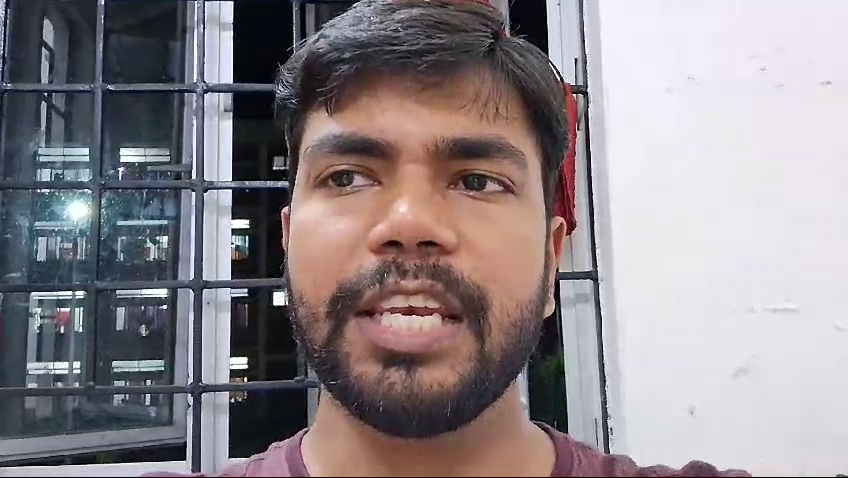

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Path to the video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4'

# Frame number to extract (e.g., 100th frame)
frame_number = 45

# Open the video file
cap = cv2.VideoCapture(video_path)

# Set the video position to the desired frame
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)

# Read the frame
ret, frame = cap.read()

if ret:
    # Display the frame
    cv2_imshow(frame)
else:
    print(f'Error: Could not retrieve frame {frame_number}')

# Release the video capture object
cap.release()


In [ ]:
import cv2

# Path to the video file
video_path = '/content/NO_1.mp4'

# Open the video file
cap = cv2.VideoCapture(video_path)

# Check if the video file was opened successfully
if not cap.isOpened():
    print("Error: Could not open video file.")
else:
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames: {frame_count}")

    frame_number = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Display the current frame number
        print(f"Processing frame {frame_number}")

        # Optionally display the frame (commented out to avoid flooding with windows)
        # cv2.imshow(f'Frame {frame_number}', frame)
        # cv2.waitKey(1)  # You can adjust this to control the speed of frame display

        frame_number += 1

    print("Finished processing all frames.")

# Release the video capture object
cap.release()
# cv2.destroyAllWindows()  # Uncomment if using cv2.imshow


Total frames: 22
Processing frame 0
Processing frame 1
Processing frame 2
Processing frame 3
Processing frame 4
Processing frame 5
Processing frame 6
Processing frame 7
Processing frame 8
Processing frame 9
Processing frame 10
Processing frame 11
Processing frame 12
Processing frame 13
Processing frame 14
Processing frame 15
Processing frame 16
Processing frame 17
Processing frame 18
Processing frame 19
Processing frame 20
Finished processing all frames.


In [ ]:
import cv2
import os

# Path to the video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM.mp4'

# Create a directory to save the frames
output_dir = 'frames_output'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Open the video file
cap = cv2.VideoCapture(video_path)

# Check if the video file was opened successfully
if not cap.isOpened():
    print("Error: Could not open video file.")
else:
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames: {frame_count}")

    frame_number = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Display the current frame number
        print(f"Processing frame {frame_number}")

        # Save the frame as an image file
        frame_filename = os.path.join(output_dir, f'frame_{frame_number:04d}.png')  # Save as PNG format
        cv2.imwrite(frame_filename, frame)

        # Optionally display the frame (commented out to avoid flooding with windows)
        # cv2.imshow(f'Frame {frame_number}', frame)
        # cv2.waitKey(1)  # You can adjust this to control the speed of frame display

        frame_number += 1

    print("Finished processing all frames.")

# Release the video capture object
cap.release()
# cv2.destroyAllWindows()  # Uncomment if using cv2.imshow


Total frames: 102
Processing frame 0
Processing frame 1
Processing frame 2
Processing frame 3
Processing frame 4
Processing frame 5
Processing frame 6
Processing frame 7
Processing frame 8
Processing frame 9
Processing frame 10
Processing frame 11
Processing frame 12
Processing frame 13
Processing frame 14
Processing frame 15
Processing frame 16
Processing frame 17
Processing frame 18
Processing frame 19
Processing frame 20
Processing frame 21
Processing frame 22
Processing frame 23
Processing frame 24
Processing frame 25
Processing frame 26
Processing frame 27
Processing frame 28
Processing frame 29
Processing frame 30
Processing frame 31
Processing frame 32
Processing frame 33
Processing frame 34
Processing frame 35
Processing frame 36
Processing frame 37
Processing frame 38
Processing frame 39
Processing frame 40
Processing frame 41
Processing frame 42
Processing frame 43
Processing frame 44
Processing frame 45
Processing frame 46
Processing frame 47
Processing frame 48
Processing f

In [ ]:
pip install opencv-python dlib


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Load the frame (you can replace this with your actual frame)
frame = cv2.imread('/content/extracted_frame.png')

# Convert the image to grayscale
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Detect faces in the grayscale image
faces = detector(gray)

# Loop over the face detections
for face in faces:
    # Get the landmarks/parts for the face
    landmarks = predictor(gray, face)

    # Extract lip coordinates (the mouth region is from points 48 to 67)
    lip_points = []
    for i in range(48, 60):
        x = landmarks.part(i).x
        y = landmarks.part(i).y
        lip_points.append((x, y))

    # Convert the points to a numpy array
    lip_points = np.array(lip_points)

    # Create a mask with the same size as the frame
    mask = np.zeros_like(gray)

    # Fill the lip region on the mask
    cv2.fillPoly(mask, [lip_points], 255)

    # Extract the lip region using bitwise AND
    lip_region = cv2.bitwise_and(frame, frame, mask=mask)

    # Crop the lip region (bounding box around the lips)
    (x, y, w, h) = cv2.boundingRect(lip_points)
    cropped_lip = lip_region[y:y + h, x:x + w]

    # Display the cropped lip region using cv2_imshow
    cv2_imshow(cropped_lip)

# Optionally, save the cropped lip region
# cv2.imwrite('cropped_lip.png', cropped_lip)


error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
from skimage.feature import local_binary_pattern

# Parameters for LBP
radius = 1
n_points = 8 * radius

def extract_lbp_features(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')
    # Compute the histogram of LBP values
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    return hist

# Extract LBP features
lbp_features = extract_lbp_features(cropped_lip)
print(lbp_features)


[  65  155  106  408  839  734  197  129 1783  176]


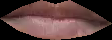

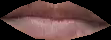

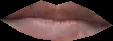

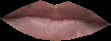

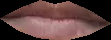

...

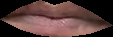

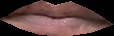

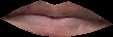

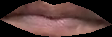

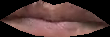

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))
            #print(lip_points)

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Display the cropped lip region using cv2_imshow
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


In [ ]:
print(lip_points)

[[351 310]
 [371 298]
 [391 290]
 [404 295]
 [418 292]
 [440 301]
 [460 315]
 [438 323]
 [417 326]
 [402 326]
 [387 325]
 [369 319]]


In [ ]:
#@@@@@@@code for extracting a single frame and downloading as jpg@@@@@
import cv2

# Path to the video file
video_path = "/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4"

# Frame number to extract (0-based index)
frame_number = 45  # Change this to the frame number you want to extract

# Create a VideoCapture object
cap = cv2.VideoCapture(video_path)

# Set the frame position
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)

# Read the frame
ret, frame = cap.read()

if ret:
    # Frame successfully read
    frame_name = f"frame_{frame_number}.jpg"

    # Save the frame as an image file
    cv2.imwrite(frame_name, frame)

    print(f"Frame {frame_number} saved as {frame_name}")
else:
    print(f"Failed to read frame {frame_number}")

# Release the VideoCapture object
cap.release()


Frame 45 saved as frame_45.jpg


Frame 0 - Lip Distance: 1.00 pixels


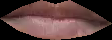

Frame 1 - Lip Distance: 0.00 pixels


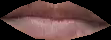

Frame 2 - Lip Distance: 0.00 pixels


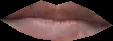

Frame 3 - Lip Distance: 1.00 pixels


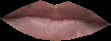

Frame 4 - Lip Distance: 1.00 pixels


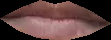

Frame 5 - Lip Distance: 0.00 pixels


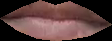

Frame 6 - Lip Distance: 1.00 pixels


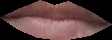

Frame 7 - Lip Distance: 0.00 pixels


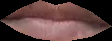

Frame 8 - Lip Distance: 1.00 pixels


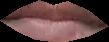

Frame 9 - Lip Distance: 1.00 pixels


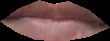

Frame 10 - Lip Distance: 1.41 pixels


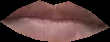

Frame 11 - Lip Distance: 1.41 pixels


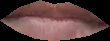

Frame 12 - Lip Distance: 1.00 pixels


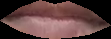

Frame 13 - Lip Distance: 1.00 pixels


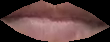

Frame 14 - Lip Distance: 1.41 pixels


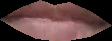

Frame 15 - Lip Distance: 2.00 pixels


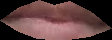

Frame 16 - Lip Distance: 3.16 pixels


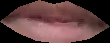

Frame 17 - Lip Distance: 4.00 pixels


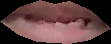

Frame 18 - Lip Distance: 5.00 pixels


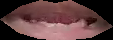

Frame 19 - Lip Distance: 5.00 pixels


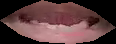

Frame 20 - Lip Distance: 5.00 pixels


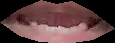

Frame 21 - Lip Distance: 10.00 pixels


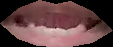

Frame 22 - Lip Distance: 9.00 pixels


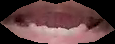

Frame 23 - Lip Distance: 9.00 pixels


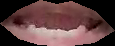

Frame 24 - Lip Distance: 10.00 pixels


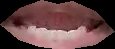

Frame 25 - Lip Distance: 10.00 pixels


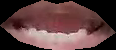

Frame 26 - Lip Distance: 12.00 pixels


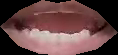

Frame 27 - Lip Distance: 15.00 pixels


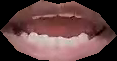

Frame 28 - Lip Distance: 17.03 pixels


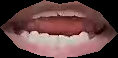

Frame 29 - Lip Distance: 15.03 pixels


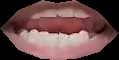

Frame 30 - Lip Distance: 25.00 pixels


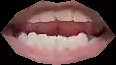

Frame 31 - Lip Distance: 23.02 pixels


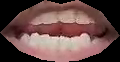

Frame 32 - Lip Distance: 23.00 pixels


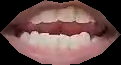

Frame 33 - Lip Distance: 25.00 pixels


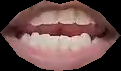

Frame 34 - Lip Distance: 12.04 pixels


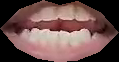

Frame 35 - Lip Distance: 22.00 pixels


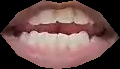

Frame 36 - Lip Distance: 28.02 pixels


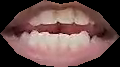

Frame 37 - Lip Distance: 27.07 pixels


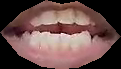

Frame 38 - Lip Distance: 25.02 pixels


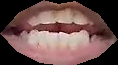

Frame 39 - Lip Distance: 20.02 pixels


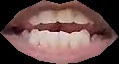

Frame 40 - Lip Distance: 26.00 pixels


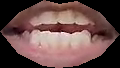

Frame 41 - Lip Distance: 20.02 pixels


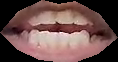

Frame 42 - Lip Distance: 19.03 pixels


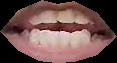

Frame 43 - Lip Distance: 24.02 pixels


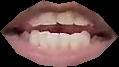

Frame 44 - Lip Distance: 20.00 pixels


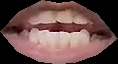

Frame 45 - Lip Distance: 19.00 pixels


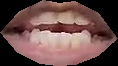

Frame 46 - Lip Distance: 18.03 pixels


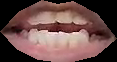

Frame 47 - Lip Distance: 16.12 pixels


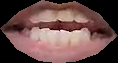

Frame 48 - Lip Distance: 17.00 pixels


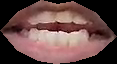

Frame 49 - Lip Distance: 21.00 pixels


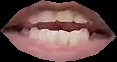

Frame 50 - Lip Distance: 21.02 pixels


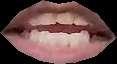

Frame 51 - Lip Distance: 25.00 pixels


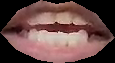

Frame 52 - Lip Distance: 23.02 pixels


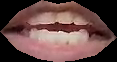

Frame 53 - Lip Distance: 23.00 pixels


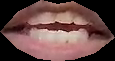

Frame 54 - Lip Distance: 21.02 pixels


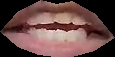

Frame 55 - Lip Distance: 19.03 pixels


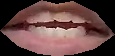

Frame 56 - Lip Distance: 14.00 pixels


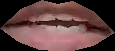

Frame 57 - Lip Distance: 7.00 pixels


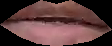

Frame 58 - Lip Distance: 4.12 pixels


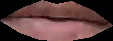

Frame 59 - Lip Distance: 2.24 pixels


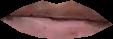

Frame 60 - Lip Distance: 2.00 pixels


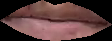

Frame 61 - Lip Distance: 3.16 pixels


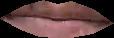

Frame 62 - Lip Distance: 6.00 pixels


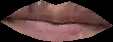

Frame 63 - Lip Distance: 2.24 pixels


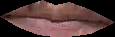

Frame 64 - Lip Distance: 1.00 pixels


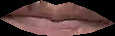

Frame 65 - Lip Distance: 1.00 pixels


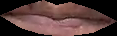

Frame 66 - Lip Distance: 10.05 pixels


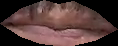

Frame 67 - Lip Distance: 11.05 pixels


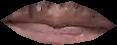

Frame 68 - Lip Distance: 11.05 pixels


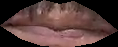

Frame 69 - Lip Distance: 6.08 pixels


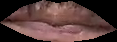

Frame 70 - Lip Distance: 6.08 pixels


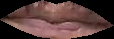

Frame 71 - Lip Distance: 2.24 pixels


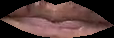

Frame 72 - Lip Distance: 1.00 pixels


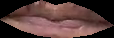

Frame 73 - Lip Distance: 1.00 pixels


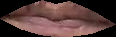

Frame 74 - Lip Distance: 0.00 pixels


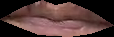

Frame 75 - Lip Distance: 1.41 pixels


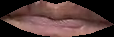

Frame 76 - Lip Distance: 2.00 pixels


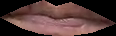

Frame 77 - Lip Distance: 1.00 pixels


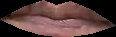

Frame 78 - Lip Distance: 1.00 pixels


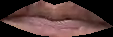

Frame 79 - Lip Distance: 1.00 pixels


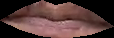

Frame 80 - Lip Distance: 1.00 pixels


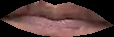

Frame 81 - Lip Distance: 1.00 pixels


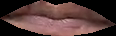

Frame 82 - Lip Distance: 0.00 pixels


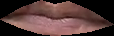

Frame 83 - Lip Distance: 2.24 pixels


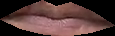

Frame 84 - Lip Distance: 2.24 pixels


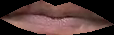

Frame 85 - Lip Distance: 0.00 pixels


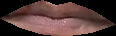

Frame 86 - Lip Distance: 1.41 pixels


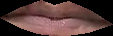

Frame 87 - Lip Distance: 0.00 pixels


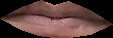

Frame 88 - Lip Distance: 1.00 pixels


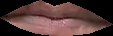

Frame 89 - Lip Distance: 2.24 pixels


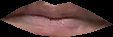

Frame 90 - Lip Distance: 1.41 pixels


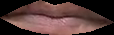

Frame 91 - Lip Distance: 1.00 pixels


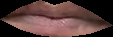

Frame 92 - Lip Distance: 1.00 pixels


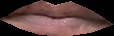

Frame 93 - Lip Distance: 1.41 pixels


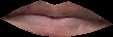

Frame 94 - Lip Distance: 0.00 pixels


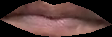

Frame 95 - Lip Distance: 1.41 pixels


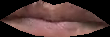

In [ ]:
#@@@@@@@@@@code for measuring the vertical distance of the entre of the inner lips@@@@@@@@@@@@
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 92.14 pixels


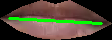

Frame 1 - Lip Distance: 93.19 pixels


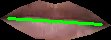

Frame 2 - Lip Distance: 94.09 pixels


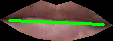

Frame 3 - Lip Distance: 92.20 pixels


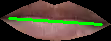

Frame 4 - Lip Distance: 93.13 pixels


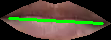

Frame 5 - Lip Distance: 94.13 pixels


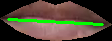

Frame 6 - Lip Distance: 93.19 pixels


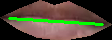

Frame 7 - Lip Distance: 93.13 pixels


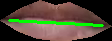

Frame 8 - Lip Distance: 91.14 pixels


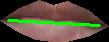

Frame 9 - Lip Distance: 90.20 pixels


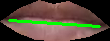

Frame 10 - Lip Distance: 91.20 pixels


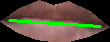

Frame 11 - Lip Distance: 91.20 pixels


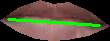

Frame 12 - Lip Distance: 92.14 pixels


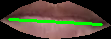

Frame 13 - Lip Distance: 91.20 pixels


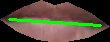

Frame 14 - Lip Distance: 94.19 pixels


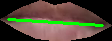

Frame 15 - Lip Distance: 94.19 pixels


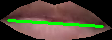

Frame 16 - Lip Distance: 92.14 pixels


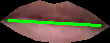

Frame 17 - Lip Distance: 93.19 pixels


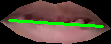

Frame 18 - Lip Distance: 94.19 pixels


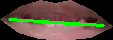

Frame 19 - Lip Distance: 96.19 pixels


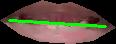

Frame 20 - Lip Distance: 95.13 pixels


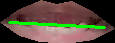

Frame 21 - Lip Distance: 94.13 pixels


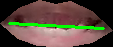

Frame 22 - Lip Distance: 96.13 pixels


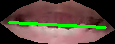

Frame 23 - Lip Distance: 94.13 pixels


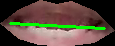

Frame 24 - Lip Distance: 95.13 pixels


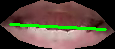

Frame 25 - Lip Distance: 95.13 pixels


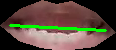

Frame 26 - Lip Distance: 96.13 pixels


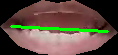

Frame 27 - Lip Distance: 96.13 pixels


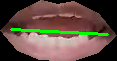

Frame 28 - Lip Distance: 98.13 pixels


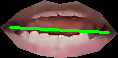

Frame 29 - Lip Distance: 98.08 pixels


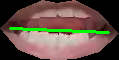

Frame 30 - Lip Distance: 97.05 pixels


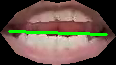

Frame 31 - Lip Distance: 101.02 pixels


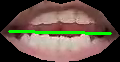

Frame 32 - Lip Distance: 99.02 pixels


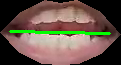

Frame 33 - Lip Distance: 100.02 pixels


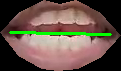

Frame 34 - Lip Distance: 99.05 pixels


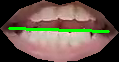

Frame 35 - Lip Distance: 99.05 pixels


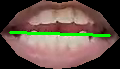

Frame 36 - Lip Distance: 101.02 pixels


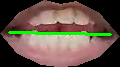

Frame 37 - Lip Distance: 100.04 pixels


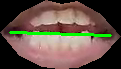

Frame 38 - Lip Distance: 98.13 pixels


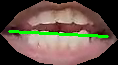

Frame 39 - Lip Distance: 98.05 pixels


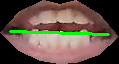

Frame 40 - Lip Distance: 100.04 pixels


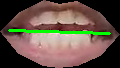

Frame 41 - Lip Distance: 99.08 pixels


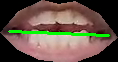

Frame 42 - Lip Distance: 96.13 pixels


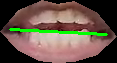

Frame 43 - Lip Distance: 97.05 pixels


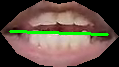

Frame 44 - Lip Distance: 97.19 pixels


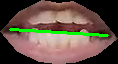

Frame 45 - Lip Distance: 97.08 pixels


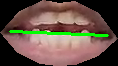

Frame 46 - Lip Distance: 97.13 pixels


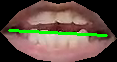

Frame 47 - Lip Distance: 97.13 pixels


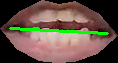

Frame 48 - Lip Distance: 96.19 pixels


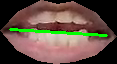

Frame 49 - Lip Distance: 96.08 pixels


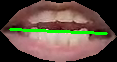

Frame 50 - Lip Distance: 95.13 pixels


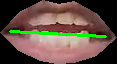

Frame 51 - Lip Distance: 95.13 pixels


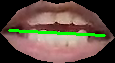

Frame 52 - Lip Distance: 96.19 pixels


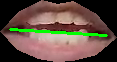

Frame 53 - Lip Distance: 94.13 pixels


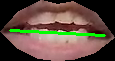

Frame 54 - Lip Distance: 95.08 pixels


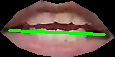

Frame 55 - Lip Distance: 95.08 pixels


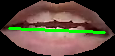

Frame 56 - Lip Distance: 94.09 pixels


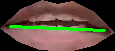

Frame 57 - Lip Distance: 92.09 pixels


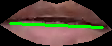

Frame 58 - Lip Distance: 94.09 pixels


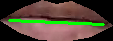

Frame 59 - Lip Distance: 94.09 pixels


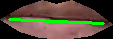

Frame 60 - Lip Distance: 94.09 pixels


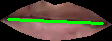

Frame 61 - Lip Distance: 95.08 pixels


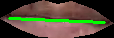

Frame 62 - Lip Distance: 96.05 pixels


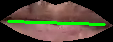

Frame 63 - Lip Distance: 95.19 pixels


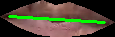

Frame 64 - Lip Distance: 96.13 pixels


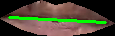

Frame 65 - Lip Distance: 96.13 pixels


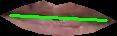

Frame 66 - Lip Distance: 99.08 pixels


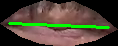

Frame 67 - Lip Distance: 99.08 pixels


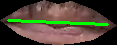

Frame 68 - Lip Distance: 99.08 pixels


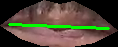

Frame 69 - Lip Distance: 97.19 pixels


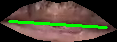

Frame 70 - Lip Distance: 95.19 pixels


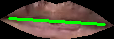

Frame 71 - Lip Distance: 95.19 pixels


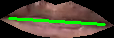

Frame 72 - Lip Distance: 95.13 pixels


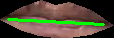

Frame 73 - Lip Distance: 97.13 pixels


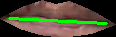

Frame 74 - Lip Distance: 96.19 pixels


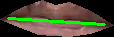

Frame 75 - Lip Distance: 96.13 pixels


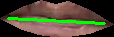

Frame 76 - Lip Distance: 97.13 pixels


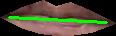

Frame 77 - Lip Distance: 96.13 pixels


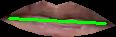

Frame 78 - Lip Distance: 95.08 pixels


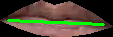

Frame 79 - Lip Distance: 95.13 pixels


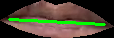

Frame 80 - Lip Distance: 96.13 pixels


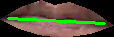

Frame 81 - Lip Distance: 97.13 pixels


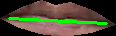

Frame 82 - Lip Distance: 96.13 pixels


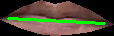

Frame 83 - Lip Distance: 97.19 pixels


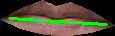

Frame 84 - Lip Distance: 97.13 pixels


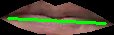

Frame 85 - Lip Distance: 97.13 pixels


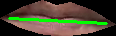

Frame 86 - Lip Distance: 95.19 pixels


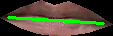

Frame 87 - Lip Distance: 95.13 pixels


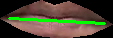

Frame 88 - Lip Distance: 95.19 pixels


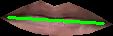

Frame 89 - Lip Distance: 95.13 pixels


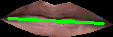

Frame 90 - Lip Distance: 97.13 pixels


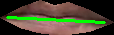

Frame 91 - Lip Distance: 94.09 pixels


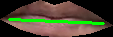

Frame 92 - Lip Distance: 95.08 pixels


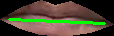

Frame 93 - Lip Distance: 94.13 pixels


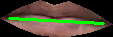

Frame 94 - Lip Distance: 93.13 pixels


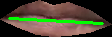

Frame 95 - Lip Distance: 91.09 pixels


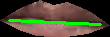

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(64)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(60)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 1.00 pixels


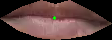

Frame 1 - Lip Distance: 0.00 pixels


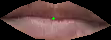

Frame 2 - Lip Distance: 0.00 pixels


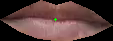

Frame 3 - Lip Distance: 1.00 pixels


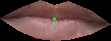

Frame 4 - Lip Distance: 1.00 pixels


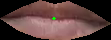

Frame 5 - Lip Distance: 0.00 pixels


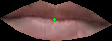

Frame 6 - Lip Distance: 1.00 pixels


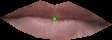

Frame 7 - Lip Distance: 0.00 pixels


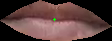

Frame 8 - Lip Distance: 1.00 pixels


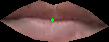

Frame 9 - Lip Distance: 1.00 pixels


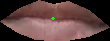

Frame 10 - Lip Distance: 1.41 pixels


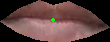

Frame 11 - Lip Distance: 1.41 pixels


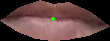

Frame 12 - Lip Distance: 1.00 pixels


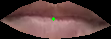

Frame 13 - Lip Distance: 1.00 pixels


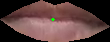

Frame 14 - Lip Distance: 1.41 pixels


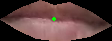

Frame 15 - Lip Distance: 2.00 pixels


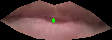

Frame 16 - Lip Distance: 3.16 pixels


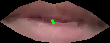

Frame 17 - Lip Distance: 4.00 pixels


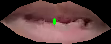

Frame 18 - Lip Distance: 5.00 pixels


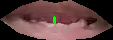

Frame 19 - Lip Distance: 5.00 pixels


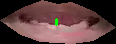

Frame 20 - Lip Distance: 5.00 pixels


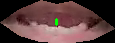

Frame 21 - Lip Distance: 10.00 pixels


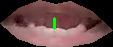

Frame 22 - Lip Distance: 9.00 pixels


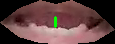

Frame 23 - Lip Distance: 9.00 pixels


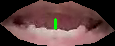

Frame 24 - Lip Distance: 10.00 pixels


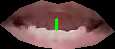

Frame 25 - Lip Distance: 10.00 pixels


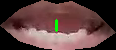

Frame 26 - Lip Distance: 12.00 pixels


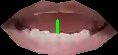

Frame 27 - Lip Distance: 15.00 pixels


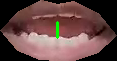

Frame 28 - Lip Distance: 17.03 pixels


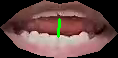

Frame 29 - Lip Distance: 15.03 pixels


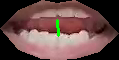

Frame 30 - Lip Distance: 25.00 pixels


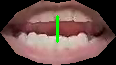

Frame 31 - Lip Distance: 23.02 pixels


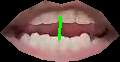

Frame 32 - Lip Distance: 23.00 pixels


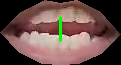

Frame 33 - Lip Distance: 25.00 pixels


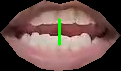

Frame 34 - Lip Distance: 12.04 pixels


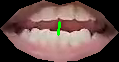

Frame 35 - Lip Distance: 22.00 pixels


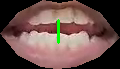

Frame 36 - Lip Distance: 28.02 pixels


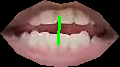

Frame 37 - Lip Distance: 27.07 pixels


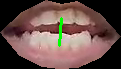

Frame 38 - Lip Distance: 25.02 pixels


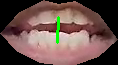

Frame 39 - Lip Distance: 20.02 pixels


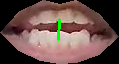

Frame 40 - Lip Distance: 26.00 pixels


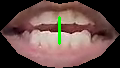

Frame 41 - Lip Distance: 20.02 pixels


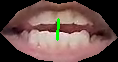

Frame 42 - Lip Distance: 19.03 pixels


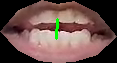

Frame 43 - Lip Distance: 24.02 pixels


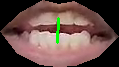

Frame 44 - Lip Distance: 20.00 pixels


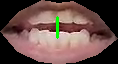

Frame 45 - Lip Distance: 19.00 pixels


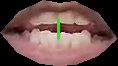

Frame 46 - Lip Distance: 18.03 pixels


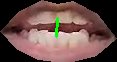

Frame 47 - Lip Distance: 16.12 pixels


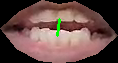

Frame 48 - Lip Distance: 17.00 pixels


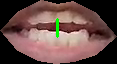

Frame 49 - Lip Distance: 21.00 pixels


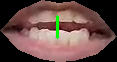

Frame 50 - Lip Distance: 21.02 pixels


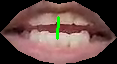

Frame 51 - Lip Distance: 25.00 pixels


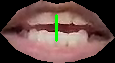

Frame 52 - Lip Distance: 23.02 pixels


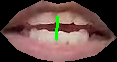

Frame 53 - Lip Distance: 23.00 pixels


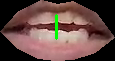

Frame 54 - Lip Distance: 21.02 pixels


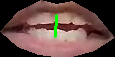

Frame 55 - Lip Distance: 19.03 pixels


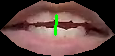

Frame 56 - Lip Distance: 14.00 pixels


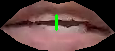

Frame 57 - Lip Distance: 7.00 pixels


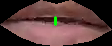

Frame 58 - Lip Distance: 4.12 pixels


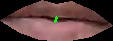

Frame 59 - Lip Distance: 2.24 pixels


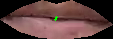

Frame 60 - Lip Distance: 2.00 pixels


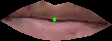

Frame 61 - Lip Distance: 3.16 pixels


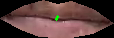

Frame 62 - Lip Distance: 6.00 pixels


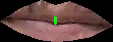

Frame 63 - Lip Distance: 2.24 pixels


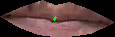

Frame 64 - Lip Distance: 1.00 pixels


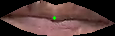

Frame 65 - Lip Distance: 1.00 pixels


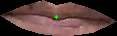

Frame 66 - Lip Distance: 10.05 pixels


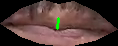

Frame 67 - Lip Distance: 11.05 pixels


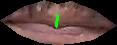

Frame 68 - Lip Distance: 11.05 pixels


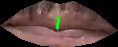

Frame 69 - Lip Distance: 6.08 pixels


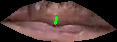

Frame 70 - Lip Distance: 6.08 pixels


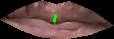

Frame 71 - Lip Distance: 2.24 pixels


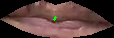

Frame 72 - Lip Distance: 1.00 pixels


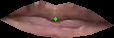

Frame 73 - Lip Distance: 1.00 pixels


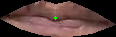

Frame 74 - Lip Distance: 0.00 pixels


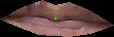

Frame 75 - Lip Distance: 1.41 pixels


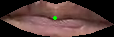

Frame 76 - Lip Distance: 2.00 pixels


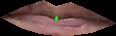

Frame 77 - Lip Distance: 1.00 pixels


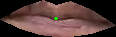

Frame 78 - Lip Distance: 1.00 pixels


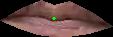

Frame 79 - Lip Distance: 1.00 pixels


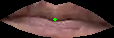

Frame 80 - Lip Distance: 1.00 pixels


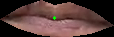

Frame 81 - Lip Distance: 1.00 pixels


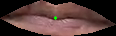

Frame 82 - Lip Distance: 0.00 pixels


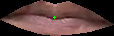

Frame 83 - Lip Distance: 2.24 pixels


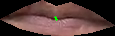

Frame 84 - Lip Distance: 2.24 pixels


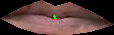

Frame 85 - Lip Distance: 0.00 pixels


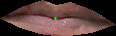

Frame 86 - Lip Distance: 1.41 pixels


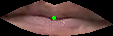

Frame 87 - Lip Distance: 0.00 pixels


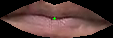

Frame 88 - Lip Distance: 1.00 pixels


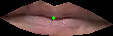

Frame 89 - Lip Distance: 2.24 pixels


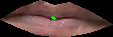

Frame 90 - Lip Distance: 1.41 pixels


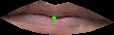

Frame 91 - Lip Distance: 1.00 pixels


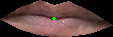

Frame 92 - Lip Distance: 1.00 pixels


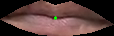

Frame 93 - Lip Distance: 1.41 pixels


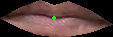

Frame 94 - Lip Distance: 0.00 pixels


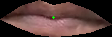

Frame 95 - Lip Distance: 1.41 pixels


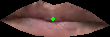

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import math  # for atan2 and converting radians to degrees

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-08-29 at 8.24.22 PM (1).mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Calculate the angle between the upper and lower lip
        delta_x = lower_lip_point.x - upper_lip_point.x
        delta_y = lower_lip_point.y - upper_lip_point.y
        angle_radians = np.arctan2(delta_y, delta_x)
        angle_degrees = np.degrees(angle_radians)

        # Display the lip distance and angle
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels, Angle: {angle_degrees:.2f} degrees")

        # Display the cropped lip region
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 18.03 pixels


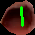

Frame 1 - Lip Distance: 16.12 pixels


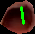

Frame 2 - Lip Distance: 19.10 pixels


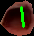

Frame 3 - Lip Distance: 20.10 pixels


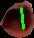

Frame 4 - Lip Distance: 5.10 pixels


Frame 5 - Lip Distance: 11.00 pixels


Frame 6 - Lip Distance: 8.00 pixels


Frame 7 - Lip Distance: 13.04 pixels


Frame 8 - Lip Distance: 15.00 pixels


Frame 9 - Lip Distance: 15.03 pixels


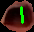

Frame 10 - Lip Distance: 14.04 pixels


Frame 11 - Lip Distance: 12.04 pixels


Frame 12 - Lip Distance: 19.03 pixels


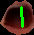

Frame 13 - Lip Distance: 20.02 pixels


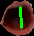

Frame 14 - Lip Distance: 19.03 pixels


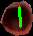

Frame 15 - Lip Distance: 18.03 pixels


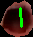

Frame 16 - Lip Distance: 19.03 pixels


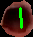

Frame 17 - Lip Distance: 20.02 pixels


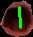

Frame 18 - Lip Distance: 21.02 pixels


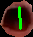

Frame 19 - Lip Distance: 20.02 pixels


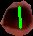

Frame 20 - Lip Distance: 20.02 pixels


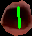

Frame 21 - Lip Distance: 19.03 pixels


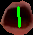

Frame 22 - Lip Distance: 17.03 pixels


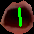

Frame 23 - Lip Distance: 17.03 pixels


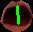

Frame 24 - Lip Distance: 16.03 pixels


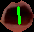

Frame 25 - Lip Distance: 17.03 pixels


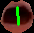

Frame 26 - Lip Distance: 17.03 pixels


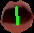

Frame 27 - Lip Distance: 16.03 pixels


Frame 28 - Lip Distance: 15.03 pixels


Frame 29 - Lip Distance: 15.03 pixels


Frame 30 - Lip Distance: 14.04 pixels


Frame 31 - Lip Distance: 15.03 pixels


Frame 32 - Lip Distance: 11.00 pixels


Frame 33 - Lip Distance: 13.04 pixels


Frame 34 - Lip Distance: 9.06 pixels


Frame 35 - Lip Distance: 8.06 pixels


Frame 36 - Lip Distance: 6.00 pixels


Frame 37 - Lip Distance: 4.12 pixels


Frame 38 - Lip Distance: 4.12 pixels


Frame 39 - Lip Distance: 4.12 pixels


Frame 40 - Lip Distance: 4.12 pixels


Frame 41 - Lip Distance: 3.16 pixels


Frame 42 - Lip Distance: 2.24 pixels


Frame 43 - Lip Distance: 2.24 pixels


Frame 44 - Lip Distance: 3.16 pixels


Frame 45 - Lip Distance: 5.10 pixels


Frame 46 - Lip Distance: 8.06 pixels


Frame 47 - Lip Distance: 11.05 pixels


Frame 48 - Lip Distance: 12.04 pixels


Frame 49 - Lip Distance: 12.04 pixels


Frame 50 - Lip Distance: 11.05 pixels


Frame 51 - Lip Distance: 11.00 pixels


Frame 52 - Lip Distance: 11.00 pixels


Frame 53 - Lip Distance: 11.05 pixels


Frame 54 - Lip Distance: 11.05 pixels


Frame 55 - Lip Distance: 12.04 pixels


Frame 56 - Lip Distance: 12.04 pixels


Frame 57 - Lip Distance: 12.04 pixels


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/O_6.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 12.04 pixels


Frame 1 - Lip Distance: 12.00 pixels


Frame 2 - Lip Distance: 12.00 pixels


Frame 3 - Lip Distance: 12.00 pixels


Frame 4 - Lip Distance: 13.00 pixels


Frame 5 - Lip Distance: 12.00 pixels


Frame 6 - Lip Distance: 13.00 pixels


Frame 7 - Lip Distance: 14.04 pixels


Frame 8 - Lip Distance: 14.00 pixels


Frame 9 - Lip Distance: 14.00 pixels


Frame 10 - Lip Distance: 13.04 pixels


Frame 11 - Lip Distance: 13.00 pixels


Frame 12 - Lip Distance: 14.00 pixels


Frame 13 - Lip Distance: 14.00 pixels


Frame 14 - Lip Distance: 14.00 pixels


Frame 15 - Lip Distance: 14.04 pixels


Frame 16 - Lip Distance: 14.00 pixels


Frame 17 - Lip Distance: 15.00 pixels


Frame 18 - Lip Distance: 15.00 pixels


Frame 19 - Lip Distance: 16.03 pixels


Frame 20 - Lip Distance: 16.00 pixels


Frame 21 - Lip Distance: 17.00 pixels


Frame 22 - Lip Distance: 19.03 pixels


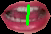

Frame 23 - Lip Distance: 20.02 pixels


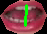

Frame 24 - Lip Distance: 22.02 pixels


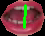

Frame 25 - Lip Distance: 23.02 pixels


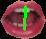

Frame 26 - Lip Distance: 22.02 pixels


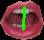

Frame 27 - Lip Distance: 23.02 pixels


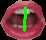

Frame 28 - Lip Distance: 24.00 pixels


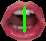

Frame 29 - Lip Distance: 25.02 pixels


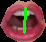

Frame 30 - Lip Distance: 21.00 pixels


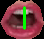

Frame 31 - Lip Distance: 18.03 pixels


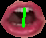

Frame 32 - Lip Distance: 22.00 pixels


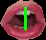

Frame 33 - Lip Distance: 19.03 pixels


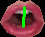

Frame 34 - Lip Distance: 20.00 pixels


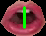

Frame 35 - Lip Distance: 16.00 pixels


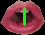

Frame 36 - Lip Distance: 14.04 pixels


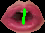

Frame 37 - Lip Distance: 12.04 pixels


Frame 38 - Lip Distance: 9.00 pixels


Frame 39 - Lip Distance: 8.06 pixels


Frame 40 - Lip Distance: 5.00 pixels


Frame 41 - Lip Distance: 5.00 pixels


Frame 42 - Lip Distance: 4.12 pixels


Frame 43 - Lip Distance: 5.00 pixels


Frame 44 - Lip Distance: 6.00 pixels


Frame 45 - Lip Distance: 8.00 pixels


Frame 46 - Lip Distance: 9.06 pixels


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/O.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 102.02 pixels


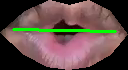

Frame 1 - Lip Distance: 100.04 pixels


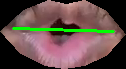

Frame 2 - Lip Distance: 101.12 pixels


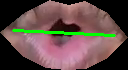

Frame 3 - Lip Distance: 100.04 pixels


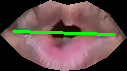

Frame 4 - Lip Distance: 98.02 pixels


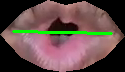

Frame 5 - Lip Distance: 98.05 pixels


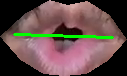

Frame 6 - Lip Distance: 97.01 pixels


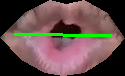

Frame 7 - Lip Distance: 97.01 pixels


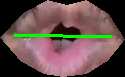

Frame 8 - Lip Distance: 101.02 pixels


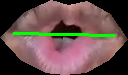

Frame 9 - Lip Distance: 97.01 pixels


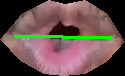

Frame 10 - Lip Distance: 100.04 pixels


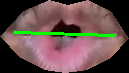

Frame 11 - Lip Distance: 97.02 pixels


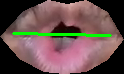

Frame 12 - Lip Distance: 96.01 pixels


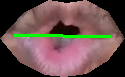

Frame 13 - Lip Distance: 97.01 pixels


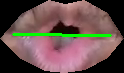

Frame 14 - Lip Distance: 98.01 pixels


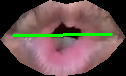

Frame 15 - Lip Distance: 96.00 pixels


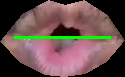

Frame 16 - Lip Distance: 101.00 pixels


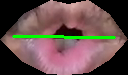

Frame 17 - Lip Distance: 100.00 pixels


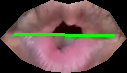

Frame 18 - Lip Distance: 99.01 pixels


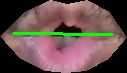

Frame 19 - Lip Distance: 98.01 pixels


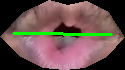

Frame 20 - Lip Distance: 99.02 pixels


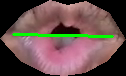

Frame 21 - Lip Distance: 100.00 pixels


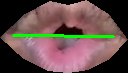

Frame 22 - Lip Distance: 98.02 pixels


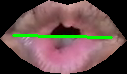

Frame 23 - Lip Distance: 98.01 pixels


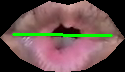

Frame 24 - Lip Distance: 100.02 pixels


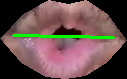

Frame 25 - Lip Distance: 99.02 pixels


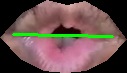

Frame 26 - Lip Distance: 102.08 pixels


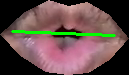

Frame 27 - Lip Distance: 102.04 pixels


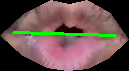

Frame 28 - Lip Distance: 99.02 pixels


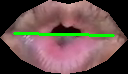

Frame 29 - Lip Distance: 100.04 pixels


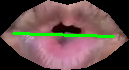

Frame 30 - Lip Distance: 100.08 pixels


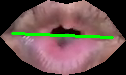

Frame 31 - Lip Distance: 99.02 pixels


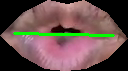

Frame 32 - Lip Distance: 101.02 pixels


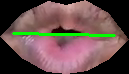

Frame 33 - Lip Distance: 98.01 pixels


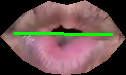

Frame 34 - Lip Distance: 99.05 pixels


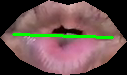

Frame 35 - Lip Distance: 102.04 pixels


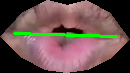

Frame 36 - Lip Distance: 105.04 pixels


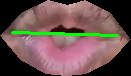

Frame 37 - Lip Distance: 103.00 pixels


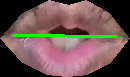

Frame 38 - Lip Distance: 105.00 pixels


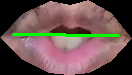

Frame 39 - Lip Distance: 107.04 pixels


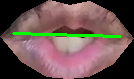

Frame 40 - Lip Distance: 109.00 pixels


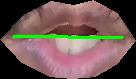

Frame 41 - Lip Distance: 114.02 pixels


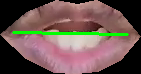

Frame 42 - Lip Distance: 118.02 pixels


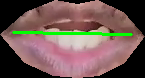

Frame 43 - Lip Distance: 119.00 pixels


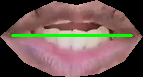

Frame 44 - Lip Distance: 121.00 pixels


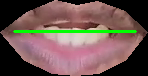

Frame 45 - Lip Distance: 122.02 pixels


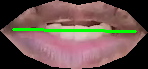

Frame 46 - Lip Distance: 118.00 pixels


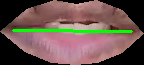

Frame 47 - Lip Distance: 116.02 pixels


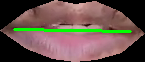

Frame 48 - Lip Distance: 116.04 pixels


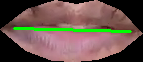

Frame 49 - Lip Distance: 117.02 pixels


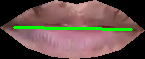

Frame 50 - Lip Distance: 118.07 pixels


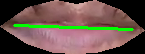

Frame 51 - Lip Distance: 118.02 pixels


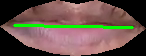

Frame 52 - Lip Distance: 121.02 pixels


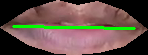

Frame 53 - Lip Distance: 122.04 pixels


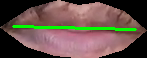

Frame 54 - Lip Distance: 116.04 pixels


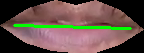

Frame 55 - Lip Distance: 120.07 pixels


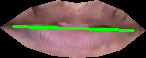

Frame 56 - Lip Distance: 119.04 pixels


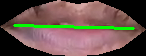

Frame 57 - Lip Distance: 118.04 pixels


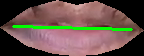

Frame 58 - Lip Distance: 115.00 pixels


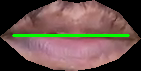

Frame 59 - Lip Distance: 119.07 pixels


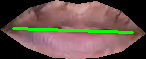

Frame 60 - Lip Distance: 120.00 pixels


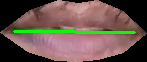

Frame 61 - Lip Distance: 121.02 pixels


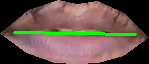

Frame 62 - Lip Distance: 120.04 pixels


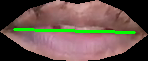

Frame 63 - Lip Distance: 126.00 pixels


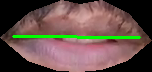

Frame 64 - Lip Distance: 119.02 pixels


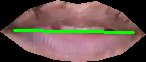

Frame 65 - Lip Distance: 116.04 pixels


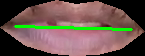

Frame 66 - Lip Distance: 119.04 pixels


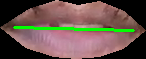

Frame 67 - Lip Distance: 117.04 pixels


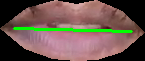

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-09-07 at 8.51.19 PM.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(64)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(60)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 123.04 pixels


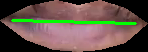

Frame 1 - Lip Distance: 120.10 pixels


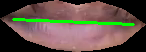

Frame 2 - Lip Distance: 121.07 pixels


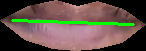

Frame 3 - Lip Distance: 119.10 pixels


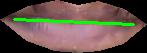

Frame 4 - Lip Distance: 117.11 pixels


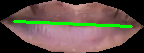

Frame 5 - Lip Distance: 122.04 pixels


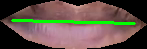

Frame 6 - Lip Distance: 123.07 pixels


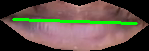

Frame 7 - Lip Distance: 121.07 pixels


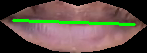

Frame 8 - Lip Distance: 122.02 pixels


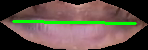

Frame 9 - Lip Distance: 122.10 pixels


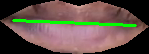

Frame 10 - Lip Distance: 120.10 pixels


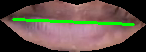

Frame 11 - Lip Distance: 121.07 pixels


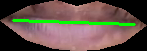

Frame 12 - Lip Distance: 118.07 pixels


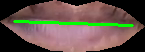

Frame 13 - Lip Distance: 120.07 pixels


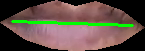

Frame 14 - Lip Distance: 118.04 pixels


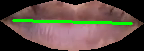

Frame 15 - Lip Distance: 115.02 pixels


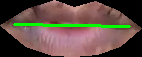

Frame 16 - Lip Distance: 110.02 pixels


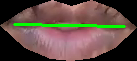

Frame 17 - Lip Distance: 109.00 pixels


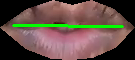

Frame 18 - Lip Distance: 110.07 pixels


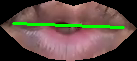

Frame 19 - Lip Distance: 110.02 pixels


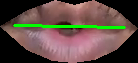

Frame 20 - Lip Distance: 110.07 pixels


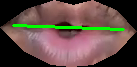

Frame 21 - Lip Distance: 109.17 pixels


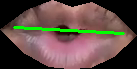

Frame 22 - Lip Distance: 107.04 pixels


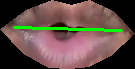

Frame 23 - Lip Distance: 108.07 pixels


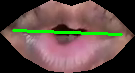

Frame 24 - Lip Distance: 107.07 pixels


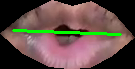

Frame 25 - Lip Distance: 105.08 pixels


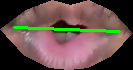

Frame 26 - Lip Distance: 103.02 pixels


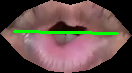

Frame 27 - Lip Distance: 106.08 pixels


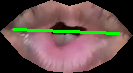

Frame 28 - Lip Distance: 106.04 pixels


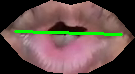

Frame 29 - Lip Distance: 109.04 pixels


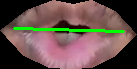

Frame 30 - Lip Distance: 109.07 pixels


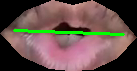

Frame 31 - Lip Distance: 108.07 pixels


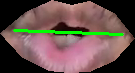

Frame 32 - Lip Distance: 110.07 pixels


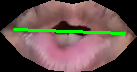

Frame 33 - Lip Distance: 108.07 pixels


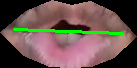

Frame 34 - Lip Distance: 108.04 pixels


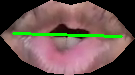

Frame 35 - Lip Distance: 108.04 pixels


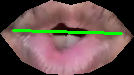

Frame 36 - Lip Distance: 109.02 pixels


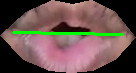

Frame 37 - Lip Distance: 110.07 pixels


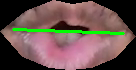

Frame 38 - Lip Distance: 109.07 pixels


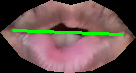

Frame 39 - Lip Distance: 110.11 pixels


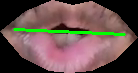

Frame 40 - Lip Distance: 107.04 pixels


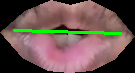

Frame 41 - Lip Distance: 104.12 pixels


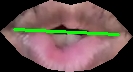

Frame 42 - Lip Distance: 105.02 pixels


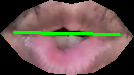

Frame 43 - Lip Distance: 107.07 pixels


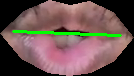

Frame 44 - Lip Distance: 106.08 pixels


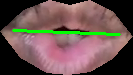

Frame 45 - Lip Distance: 110.11 pixels


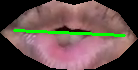

Frame 46 - Lip Distance: 111.07 pixels


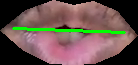

Frame 47 - Lip Distance: 107.04 pixels


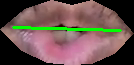

Frame 48 - Lip Distance: 109.04 pixels


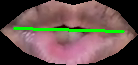

Frame 49 - Lip Distance: 110.07 pixels


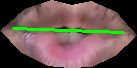

Frame 50 - Lip Distance: 105.04 pixels


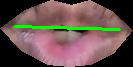

Frame 51 - Lip Distance: 110.07 pixels


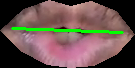

Frame 52 - Lip Distance: 106.04 pixels


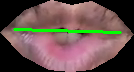

Frame 53 - Lip Distance: 109.04 pixels


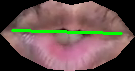

Frame 54 - Lip Distance: 108.12 pixels


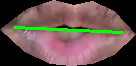

Frame 55 - Lip Distance: 109.04 pixels


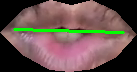

Frame 56 - Lip Distance: 107.04 pixels


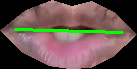

Frame 57 - Lip Distance: 109.07 pixels


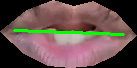

Frame 58 - Lip Distance: 116.02 pixels


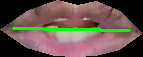

Frame 59 - Lip Distance: 114.04 pixels


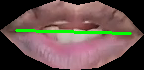

Frame 60 - Lip Distance: 117.02 pixels


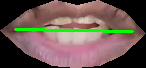

Frame 61 - Lip Distance: 118.07 pixels


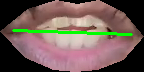

Frame 62 - Lip Distance: 117.02 pixels


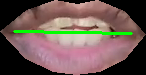

Frame 63 - Lip Distance: 117.02 pixels


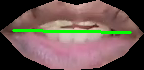

Frame 64 - Lip Distance: 119.07 pixels


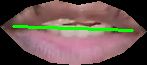

Frame 65 - Lip Distance: 118.11 pixels


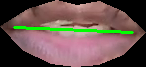

Frame 66 - Lip Distance: 116.04 pixels


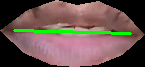

Frame 67 - Lip Distance: 118.11 pixels


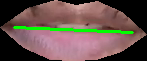

Frame 68 - Lip Distance: 122.10 pixels


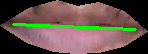

Frame 69 - Lip Distance: 119.07 pixels


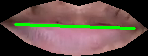

Frame 70 - Lip Distance: 121.07 pixels


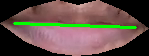

Frame 71 - Lip Distance: 121.07 pixels


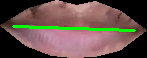

Frame 72 - Lip Distance: 126.14 pixels


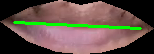

Frame 73 - Lip Distance: 129.14 pixels


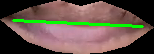

Frame 74 - Lip Distance: 126.25 pixels


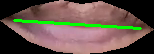

Frame 75 - Lip Distance: 129.14 pixels


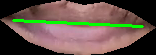

Frame 76 - Lip Distance: 129.14 pixels


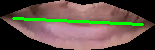

Frame 77 - Lip Distance: 132.24 pixels


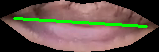

Frame 78 - Lip Distance: 130.25 pixels


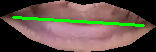

Frame 79 - Lip Distance: 132.14 pixels


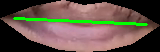

Frame 80 - Lip Distance: 129.14 pixels


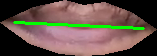

Frame 81 - Lip Distance: 127.19 pixels


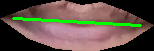

Frame 82 - Lip Distance: 128.19 pixels


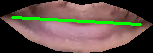

Frame 83 - Lip Distance: 132.14 pixels


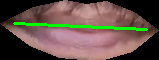

Frame 84 - Lip Distance: 130.19 pixels


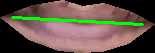

Frame 85 - Lip Distance: 129.19 pixels


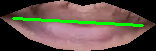

Frame 86 - Lip Distance: 128.25 pixels


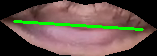

Frame 87 - Lip Distance: 128.25 pixels


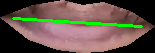

Frame 88 - Lip Distance: 129.25 pixels


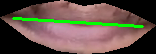

Frame 89 - Lip Distance: 127.19 pixels


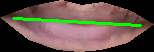

Frame 90 - Lip Distance: 129.25 pixels


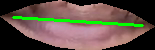

Frame 91 - Lip Distance: 125.26 pixels


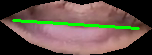

Frame 92 - Lip Distance: 128.19 pixels


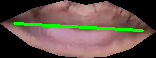

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-09-07 at 8.51.21 PM.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(64)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(60)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 124.04 pixels


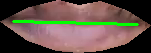

Frame 1 - Lip Distance: 122.02 pixels


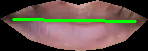

Frame 2 - Lip Distance: 123.02 pixels


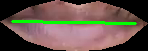

Frame 3 - Lip Distance: 122.04 pixels


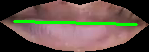

Frame 4 - Lip Distance: 126.04 pixels


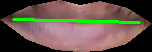

Frame 5 - Lip Distance: 124.04 pixels


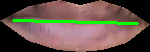

Frame 6 - Lip Distance: 121.04 pixels


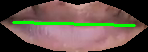

Frame 7 - Lip Distance: 126.02 pixels


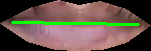

Frame 8 - Lip Distance: 125.06 pixels


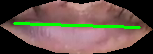

Frame 9 - Lip Distance: 121.07 pixels


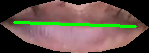

Frame 10 - Lip Distance: 120.04 pixels


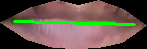

Frame 11 - Lip Distance: 116.02 pixels


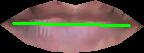

Frame 12 - Lip Distance: 117.00 pixels


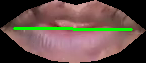

Frame 13 - Lip Distance: 115.00 pixels


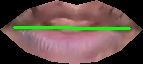

Frame 14 - Lip Distance: 115.04 pixels


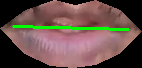

Frame 15 - Lip Distance: 113.07 pixels


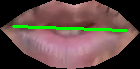

Frame 16 - Lip Distance: 108.00 pixels


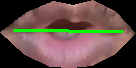

Frame 17 - Lip Distance: 109.00 pixels


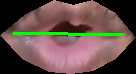

Frame 18 - Lip Distance: 108.02 pixels


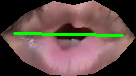

Frame 19 - Lip Distance: 106.00 pixels


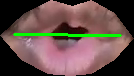

Frame 20 - Lip Distance: 107.02 pixels


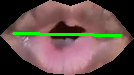

Frame 21 - Lip Distance: 104.04 pixels


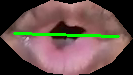

Frame 22 - Lip Distance: 103.02 pixels


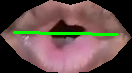

Frame 23 - Lip Distance: 103.02 pixels


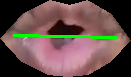

Frame 24 - Lip Distance: 105.02 pixels


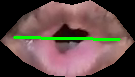

Frame 25 - Lip Distance: 106.00 pixels


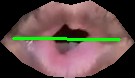

Frame 26 - Lip Distance: 104.02 pixels


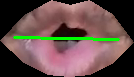

Frame 27 - Lip Distance: 105.00 pixels


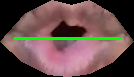

Frame 28 - Lip Distance: 102.02 pixels


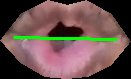

Frame 29 - Lip Distance: 104.00 pixels


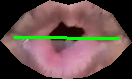

Frame 30 - Lip Distance: 102.02 pixels


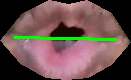

Frame 31 - Lip Distance: 106.00 pixels


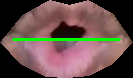

Frame 32 - Lip Distance: 106.02 pixels


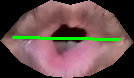

Frame 33 - Lip Distance: 104.08 pixels


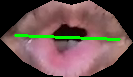

Frame 34 - Lip Distance: 104.04 pixels


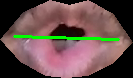

Frame 35 - Lip Distance: 105.04 pixels


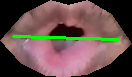

Frame 36 - Lip Distance: 108.04 pixels


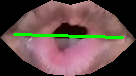

Frame 37 - Lip Distance: 106.08 pixels


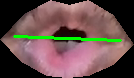

Frame 38 - Lip Distance: 104.08 pixels


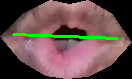

Frame 39 - Lip Distance: 105.12 pixels


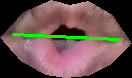

Frame 40 - Lip Distance: 103.04 pixels


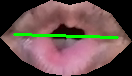

Frame 41 - Lip Distance: 105.04 pixels


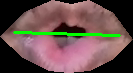

Frame 42 - Lip Distance: 108.12 pixels


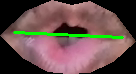

Frame 43 - Lip Distance: 105.12 pixels


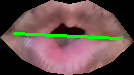

Frame 44 - Lip Distance: 104.04 pixels


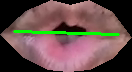

Frame 45 - Lip Distance: 107.02 pixels


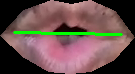

Frame 46 - Lip Distance: 106.00 pixels


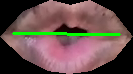

Frame 47 - Lip Distance: 105.02 pixels


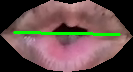

Frame 48 - Lip Distance: 102.00 pixels


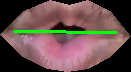

Frame 49 - Lip Distance: 103.02 pixels


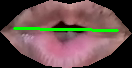

Frame 50 - Lip Distance: 104.00 pixels


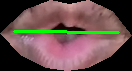

Frame 51 - Lip Distance: 103.02 pixels


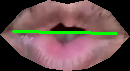

Frame 52 - Lip Distance: 103.02 pixels


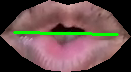

Frame 53 - Lip Distance: 105.08 pixels


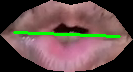

Frame 54 - Lip Distance: 111.11 pixels


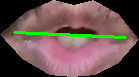

Frame 55 - Lip Distance: 112.02 pixels


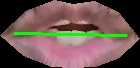

Frame 56 - Lip Distance: 114.00 pixels


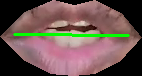

Frame 57 - Lip Distance: 114.00 pixels


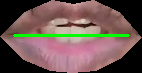

Frame 58 - Lip Distance: 118.02 pixels


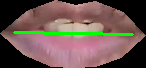

Frame 59 - Lip Distance: 121.02 pixels


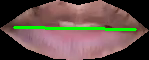

Frame 60 - Lip Distance: 123.04 pixels


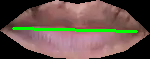

Frame 61 - Lip Distance: 124.04 pixels


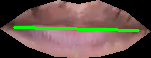

Frame 62 - Lip Distance: 123.07 pixels


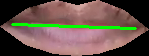

Frame 63 - Lip Distance: 125.02 pixels


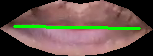

Frame 64 - Lip Distance: 125.06 pixels


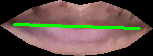

Frame 65 - Lip Distance: 129.02 pixels


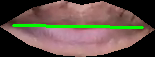

Frame 66 - Lip Distance: 126.04 pixels


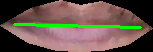

Frame 67 - Lip Distance: 126.04 pixels


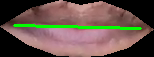

Frame 68 - Lip Distance: 127.06 pixels


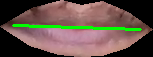

Frame 69 - Lip Distance: 127.02 pixels


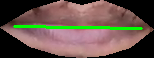

Frame 70 - Lip Distance: 126.04 pixels


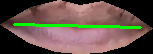

Frame 71 - Lip Distance: 127.04 pixels


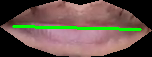

Frame 72 - Lip Distance: 126.02 pixels


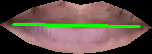

Frame 73 - Lip Distance: 120.04 pixels


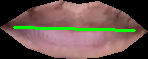

Frame 74 - Lip Distance: 125.10 pixels


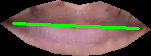

Frame 75 - Lip Distance: 123.04 pixels


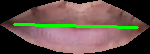

Frame 76 - Lip Distance: 125.06 pixels


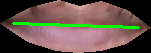

Frame 77 - Lip Distance: 127.06 pixels


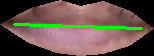

Frame 78 - Lip Distance: 123.02 pixels


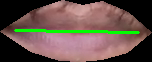

Frame 79 - Lip Distance: 124.04 pixels


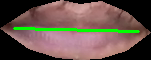

Frame 80 - Lip Distance: 123.02 pixels


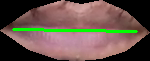

Frame 81 - Lip Distance: 123.04 pixels


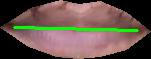

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-09-07 at 8.52.32 PM.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(64)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(60)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 1.00 pixels


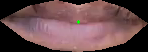

Frame 1 - Lip Distance: 1.41 pixels


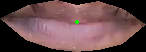

Frame 2 - Lip Distance: 1.00 pixels


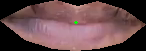

Frame 3 - Lip Distance: 2.00 pixels


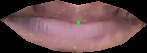

Frame 4 - Lip Distance: 1.00 pixels


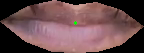

Frame 5 - Lip Distance: 2.00 pixels


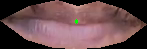

Frame 6 - Lip Distance: 2.00 pixels


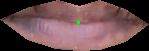

Frame 7 - Lip Distance: 1.00 pixels


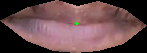

Frame 8 - Lip Distance: 1.00 pixels


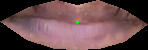

Frame 9 - Lip Distance: 1.00 pixels


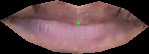

Frame 10 - Lip Distance: 1.41 pixels


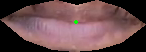

Frame 11 - Lip Distance: 0.00 pixels


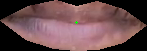

Frame 12 - Lip Distance: 1.41 pixels


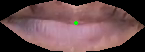

Frame 13 - Lip Distance: 1.00 pixels


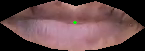

Frame 14 - Lip Distance: 1.00 pixels


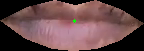

Frame 15 - Lip Distance: 6.08 pixels


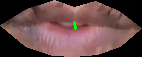

Frame 16 - Lip Distance: 7.07 pixels


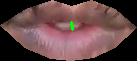

Frame 17 - Lip Distance: 11.05 pixels


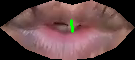

Frame 18 - Lip Distance: 8.06 pixels


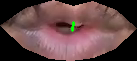

Frame 19 - Lip Distance: 8.00 pixels


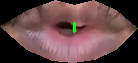

Frame 20 - Lip Distance: 12.04 pixels


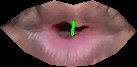

Frame 21 - Lip Distance: 14.04 pixels


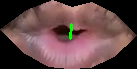

Frame 22 - Lip Distance: 14.00 pixels


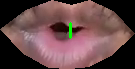

Frame 23 - Lip Distance: 10.00 pixels


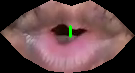

Frame 24 - Lip Distance: 9.06 pixels


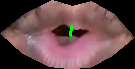

Frame 25 - Lip Distance: 12.04 pixels


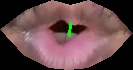

Frame 26 - Lip Distance: 9.00 pixels


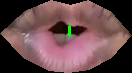

Frame 27 - Lip Distance: 7.00 pixels


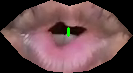

Frame 28 - Lip Distance: 14.04 pixels


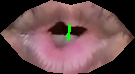

Frame 29 - Lip Distance: 9.00 pixels


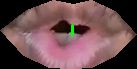

Frame 30 - Lip Distance: 11.00 pixels


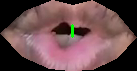

Frame 31 - Lip Distance: 15.03 pixels


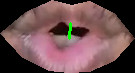

Frame 32 - Lip Distance: 10.05 pixels


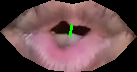

Frame 33 - Lip Distance: 10.05 pixels


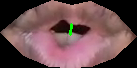

Frame 34 - Lip Distance: 13.04 pixels


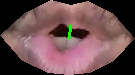

Frame 35 - Lip Distance: 18.03 pixels


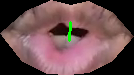

Frame 36 - Lip Distance: 13.00 pixels


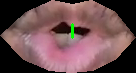

Frame 37 - Lip Distance: 14.04 pixels


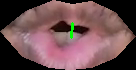

Frame 38 - Lip Distance: 13.00 pixels


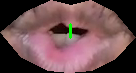

Frame 39 - Lip Distance: 14.04 pixels


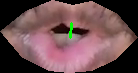

Frame 40 - Lip Distance: 15.00 pixels


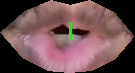

Frame 41 - Lip Distance: 12.00 pixels


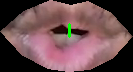

Frame 42 - Lip Distance: 19.03 pixels


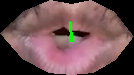

Frame 43 - Lip Distance: 17.00 pixels


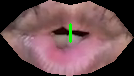

Frame 44 - Lip Distance: 15.00 pixels


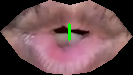

Frame 45 - Lip Distance: 12.00 pixels


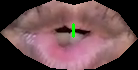

Frame 46 - Lip Distance: 11.00 pixels


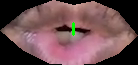

Frame 47 - Lip Distance: 14.00 pixels


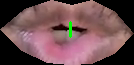

Frame 48 - Lip Distance: 12.00 pixels


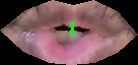

Frame 49 - Lip Distance: 9.00 pixels


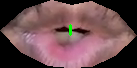

Frame 50 - Lip Distance: 10.00 pixels


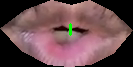

Frame 51 - Lip Distance: 11.00 pixels


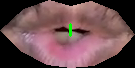

Frame 52 - Lip Distance: 15.03 pixels


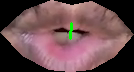

Frame 53 - Lip Distance: 11.05 pixels


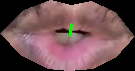

Frame 54 - Lip Distance: 10.05 pixels


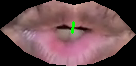

Frame 55 - Lip Distance: 12.04 pixels


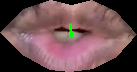

Frame 56 - Lip Distance: 11.05 pixels


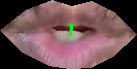

Frame 57 - Lip Distance: 8.06 pixels


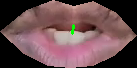

Frame 58 - Lip Distance: 9.06 pixels


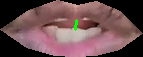

Frame 59 - Lip Distance: 10.00 pixels


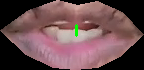

Frame 60 - Lip Distance: 17.00 pixels


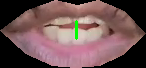

Frame 61 - Lip Distance: 26.00 pixels


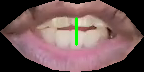

Frame 62 - Lip Distance: 24.00 pixels


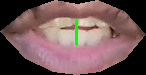

Frame 63 - Lip Distance: 21.00 pixels


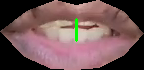

Frame 64 - Lip Distance: 12.04 pixels


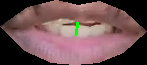

Frame 65 - Lip Distance: 13.04 pixels


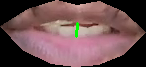

Frame 66 - Lip Distance: 12.00 pixels


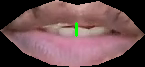

Frame 67 - Lip Distance: 7.07 pixels


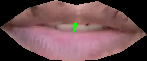

Frame 68 - Lip Distance: 3.00 pixels


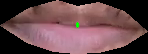

Frame 69 - Lip Distance: 2.24 pixels


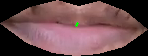

Frame 70 - Lip Distance: 2.24 pixels


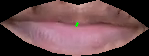

Frame 71 - Lip Distance: 4.12 pixels


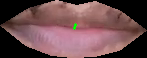

Frame 72 - Lip Distance: 3.00 pixels


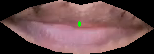

Frame 73 - Lip Distance: 1.00 pixels


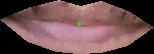

Frame 74 - Lip Distance: 4.00 pixels


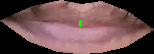

Frame 75 - Lip Distance: 1.00 pixels


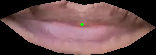

Frame 76 - Lip Distance: 1.41 pixels


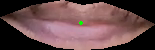

Frame 77 - Lip Distance: 3.16 pixels


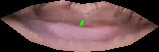

Frame 78 - Lip Distance: 0.00 pixels


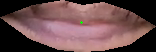

Frame 79 - Lip Distance: 1.41 pixels


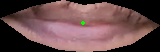

Frame 80 - Lip Distance: 3.16 pixels


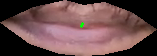

Frame 81 - Lip Distance: 1.00 pixels


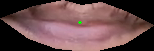

Frame 82 - Lip Distance: 2.24 pixels


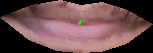

Frame 83 - Lip Distance: 8.00 pixels


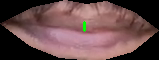

Frame 84 - Lip Distance: 0.00 pixels


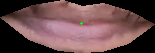

Frame 85 - Lip Distance: 1.00 pixels


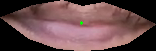

Frame 86 - Lip Distance: 2.00 pixels


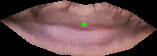

Frame 87 - Lip Distance: 1.00 pixels


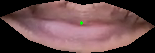

Frame 88 - Lip Distance: 1.41 pixels


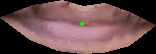

Frame 89 - Lip Distance: 0.00 pixels


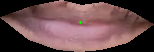

Frame 90 - Lip Distance: 2.00 pixels


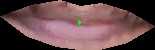

Frame 91 - Lip Distance: 2.00 pixels


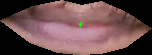

Frame 92 - Lip Distance: 3.16 pixels


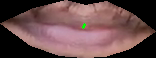

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-09-07 at 8.51.21 PM.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


Frame 0 - Lip Distance: 0.00 pixels


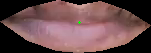

Frame 1 - Lip Distance: 3.61 pixels


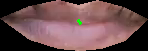

Frame 2 - Lip Distance: 0.00 pixels


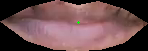

Frame 3 - Lip Distance: 1.00 pixels


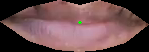

Frame 4 - Lip Distance: 1.00 pixels


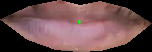

Frame 5 - Lip Distance: 1.00 pixels


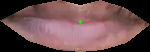

Frame 6 - Lip Distance: 2.00 pixels


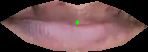

Frame 7 - Lip Distance: 1.00 pixels


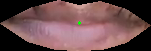

Frame 8 - Lip Distance: 3.16 pixels


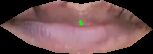

Frame 9 - Lip Distance: 1.00 pixels


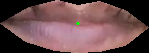

Frame 10 - Lip Distance: 1.41 pixels


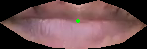

Frame 11 - Lip Distance: 2.24 pixels


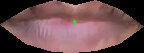

Frame 12 - Lip Distance: 10.05 pixels


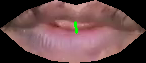

Frame 13 - Lip Distance: 14.00 pixels


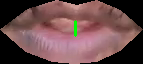

Frame 14 - Lip Distance: 17.03 pixels


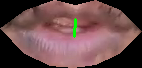

Frame 15 - Lip Distance: 12.00 pixels


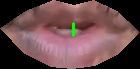

Frame 16 - Lip Distance: 10.00 pixels


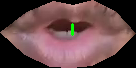

Frame 17 - Lip Distance: 10.05 pixels


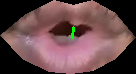

Frame 18 - Lip Distance: 12.04 pixels


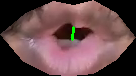

Frame 19 - Lip Distance: 10.05 pixels


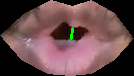

Frame 20 - Lip Distance: 11.05 pixels


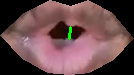

Frame 21 - Lip Distance: 11.05 pixels


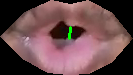

Frame 22 - Lip Distance: 11.00 pixels


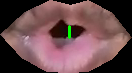

Frame 23 - Lip Distance: 14.04 pixels


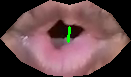

Frame 24 - Lip Distance: 10.00 pixels


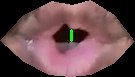

Frame 25 - Lip Distance: 13.04 pixels


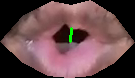

Frame 26 - Lip Distance: 10.00 pixels


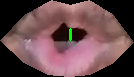

Frame 27 - Lip Distance: 10.05 pixels


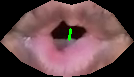

Frame 28 - Lip Distance: 13.04 pixels


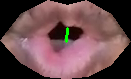

Frame 29 - Lip Distance: 13.04 pixels


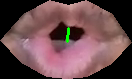

Frame 30 - Lip Distance: 14.04 pixels


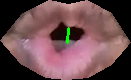

Frame 31 - Lip Distance: 11.00 pixels


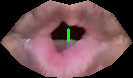

Frame 32 - Lip Distance: 12.04 pixels


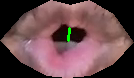

Frame 33 - Lip Distance: 13.15 pixels


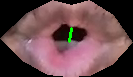

Frame 34 - Lip Distance: 12.04 pixels


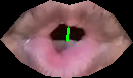

Frame 35 - Lip Distance: 11.05 pixels


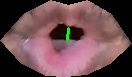

Frame 36 - Lip Distance: 12.04 pixels


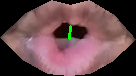

Frame 37 - Lip Distance: 10.05 pixels


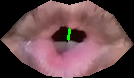

Frame 38 - Lip Distance: 12.17 pixels


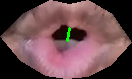

Frame 39 - Lip Distance: 12.04 pixels


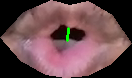

Frame 40 - Lip Distance: 12.04 pixels


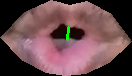

Frame 41 - Lip Distance: 9.06 pixels


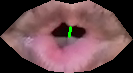

Frame 42 - Lip Distance: 11.00 pixels


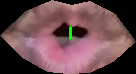

Frame 43 - Lip Distance: 11.05 pixels


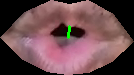

Frame 44 - Lip Distance: 10.05 pixels


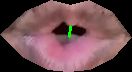

Frame 45 - Lip Distance: 11.05 pixels


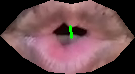

Frame 46 - Lip Distance: 14.00 pixels


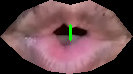

Frame 47 - Lip Distance: 11.05 pixels


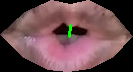

Frame 48 - Lip Distance: 13.00 pixels


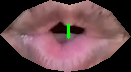

Frame 49 - Lip Distance: 9.06 pixels


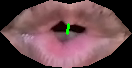

Frame 50 - Lip Distance: 10.00 pixels


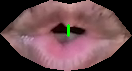

Frame 51 - Lip Distance: 12.04 pixels


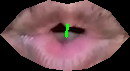

Frame 52 - Lip Distance: 11.05 pixels


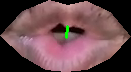

Frame 53 - Lip Distance: 10.00 pixels


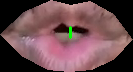

Frame 54 - Lip Distance: 12.00 pixels


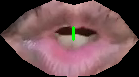

Frame 55 - Lip Distance: 11.00 pixels


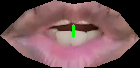

Frame 56 - Lip Distance: 14.04 pixels


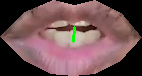

Frame 57 - Lip Distance: 15.00 pixels


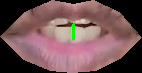

Frame 58 - Lip Distance: 16.03 pixels


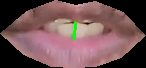

Frame 59 - Lip Distance: 9.00 pixels


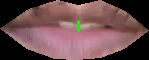

Frame 60 - Lip Distance: 4.00 pixels


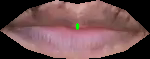

Frame 61 - Lip Distance: 4.00 pixels


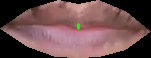

Frame 62 - Lip Distance: 2.00 pixels


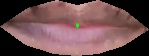

Frame 63 - Lip Distance: 2.00 pixels


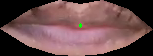

Frame 64 - Lip Distance: 2.00 pixels


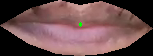

Frame 65 - Lip Distance: 4.00 pixels


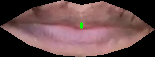

Frame 66 - Lip Distance: 2.24 pixels


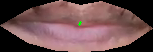

Frame 67 - Lip Distance: 4.00 pixels


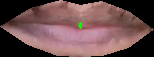

Frame 68 - Lip Distance: 2.00 pixels


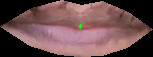

Frame 69 - Lip Distance: 3.16 pixels


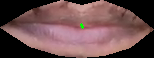

Frame 70 - Lip Distance: 4.12 pixels


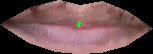

Frame 71 - Lip Distance: 2.00 pixels


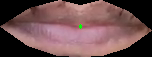

Frame 72 - Lip Distance: 2.24 pixels


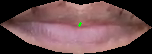

Frame 73 - Lip Distance: 5.10 pixels


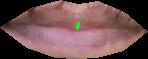

Frame 74 - Lip Distance: 2.00 pixels


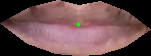

Frame 75 - Lip Distance: 2.00 pixels


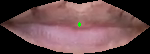

Frame 76 - Lip Distance: 2.00 pixels


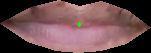

Frame 77 - Lip Distance: 0.00 pixels


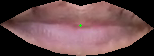

Frame 78 - Lip Distance: 3.00 pixels


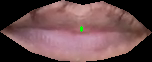

Frame 79 - Lip Distance: 2.24 pixels


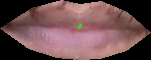

Frame 80 - Lip Distance: 4.00 pixels


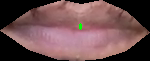

Frame 81 - Lip Distance: 2.00 pixels


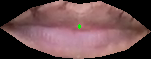

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/WhatsApp Video 2024-09-07 at 8.52.32 PM.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Display the cropped lip region and lip distance using cv2_imshow
        print(f"Frame {frame_number} - Lip Distance: {lip_distance:.2f} pixels")
        cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()


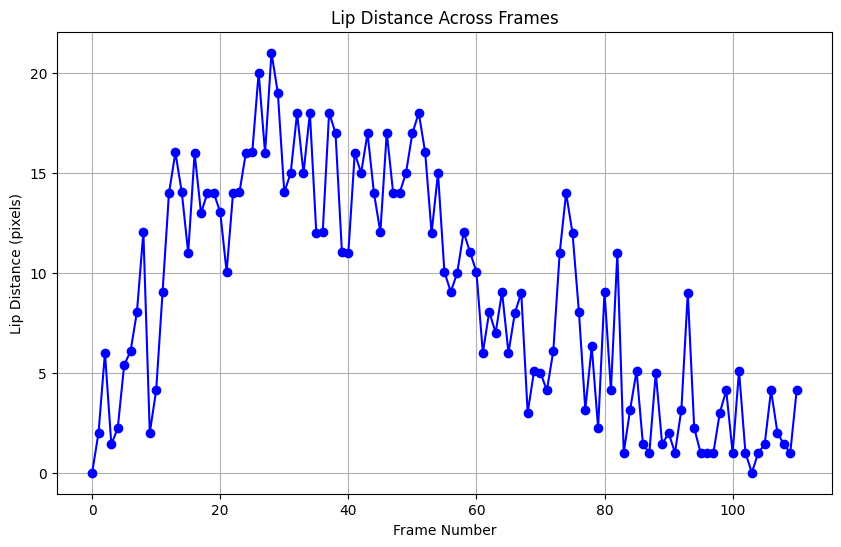

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/O_1.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

# List to store the lip distances and frame numbers
lip_distances = []
frame_numbers = []

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Append the frame number and lip distance to the lists
        frame_numbers.append(frame_number)
        lip_distances.append(lip_distance)

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Optionally, display the cropped lip region
        # cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()

# Plotting the graph of frame number vs lip distance
plt.figure(figsize=(10, 6))
plt.plot(frame_numbers, lip_distances, marker='o', linestyle='-', color='b')
plt.xlabel('Frame Number')
plt.ylabel('Lip Distance (pixels)')
plt.title('Lip Distance Across Frames')
plt.grid(True)
plt.show()


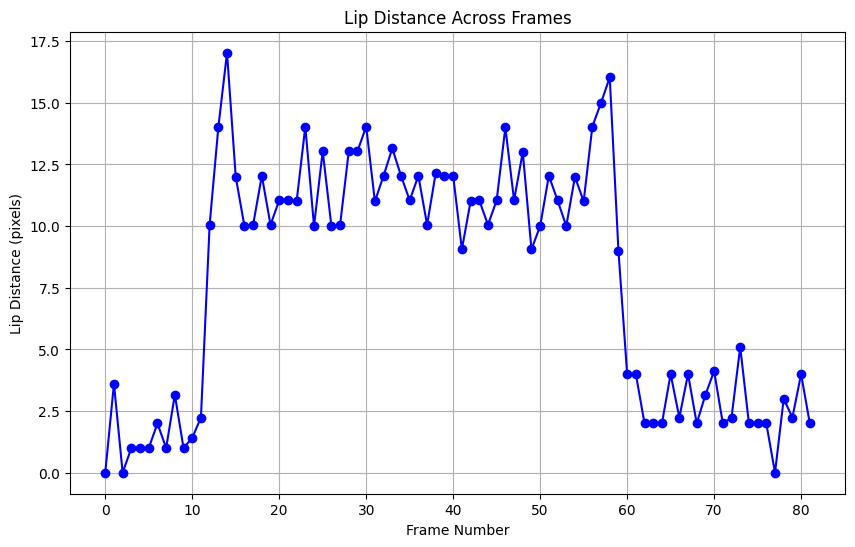

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/O_2.mp4'

# Open the video file
video_capture = cv2.VideoCapture(video_path)

if not video_capture.isOpened():
    raise FileNotFoundError(f"Unable to open video file {video_path}")

# List to store the lip distances and frame numbers
lip_distances = []
frame_numbers = []

frame_number = 0

while True:
    # Read the next frame
    ret, frame = video_capture.read()

    # Break the loop if no more frames are available
    if not ret:
        break

    # Convert the image to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale image
    faces = detector(gray)

    # Loop over the face detections
    for face in faces:
        # Get the landmarks/parts for the face
        landmarks = predictor(gray, face)

        # Extract lip coordinates (the mouth region is from points 48 to 67)
        lip_points = []
        for i in range(48, 60):
            x = landmarks.part(i).x
            y = landmarks.part(i).y
            lip_points.append((x, y))

        # Convert the points to a numpy array
        lip_points = np.array(lip_points)

        # Create a mask with the same size as the frame
        mask = np.zeros_like(gray)

        # Fill the lip region on the mask
        cv2.fillPoly(mask, [lip_points], 255)

        # Extract the lip region using bitwise AND
        lip_region = cv2.bitwise_and(frame, frame, mask=mask)

        # Crop the lip region (bounding box around the lips)
        (x, y, w, h) = cv2.boundingRect(lip_points)
        cropped_lip = lip_region[y:y + h, x:x + w]

        # Calculate the distance between upper and lower lips
        upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
        lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
        lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                      np.array([lower_lip_point.x, lower_lip_point.y]))

        # Append the frame number and lip distance to the lists
        frame_numbers.append(frame_number)
        lip_distances.append(lip_distance)

        # Adjust the coordinates relative to the cropped region
        adjusted_upper_lip_point = (upper_lip_point.x - x, upper_lip_point.y - y)
        adjusted_lower_lip_point = (lower_lip_point.x - x, lower_lip_point.y - y)

        # Draw a line between the adjusted upper and lower lip points
        cv2.line(cropped_lip, adjusted_upper_lip_point,
                            adjusted_lower_lip_point, (0, 255, 0), 2)

        # Optionally, display the cropped lip region
        # cv2_imshow(cropped_lip)

        # Optionally, save the cropped lip region
        # cv2.imwrite(f'cropped_lip_frame_{frame_number}.png', cropped_lip)

    frame_number += 1

# Release the video capture object
video_capture.release()

# Plotting the graph of frame number vs lip distance
plt.figure(figsize=(10, 6))
plt.plot(frame_numbers, lip_distances, marker='o', linestyle='-', color='b')
plt.xlabel('Frame Number')
plt.ylabel('Lip Distance (pixels)')
plt.title('Lip Distance Across Frames')
plt.grid(True)
plt.show()


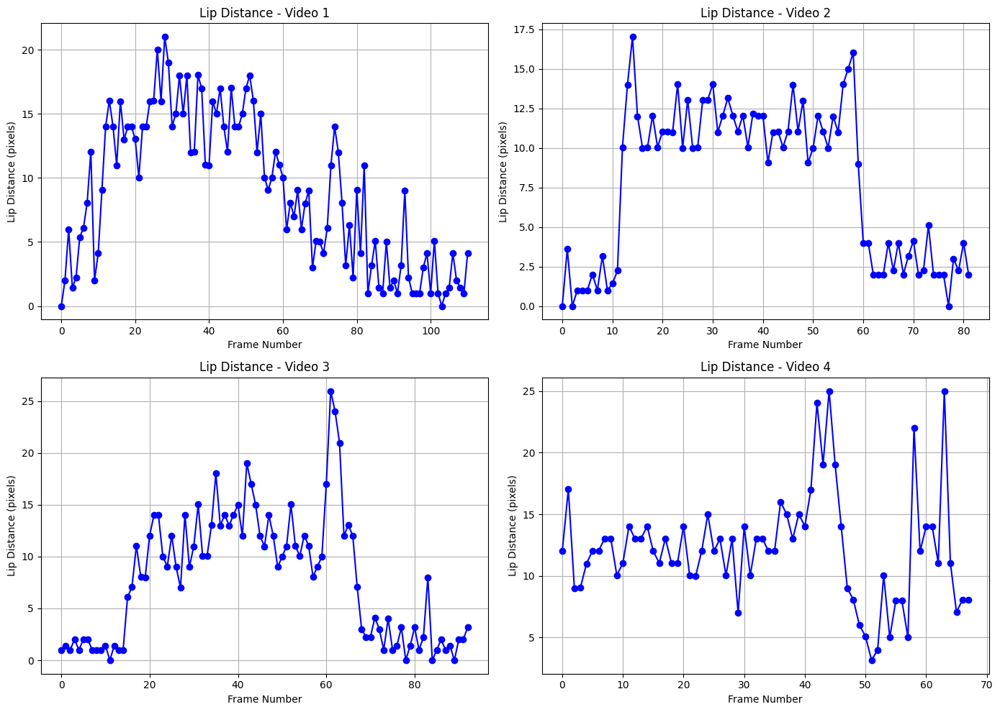

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/O_1.mp4',
    '/content/O_2.mp4',
    '/content/O_3.mp4',
    '/content/O_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers and lip distances """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # List to store the lip distances and frame numbers
    lip_distances = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 60):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the distance between upper and lower lips
            upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
            lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
            lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                          np.array([lower_lip_point.x, lower_lip_point.y]))

            # Append the frame number and lip distance to the lists
            frame_numbers.append(frame_number)
            lip_distances.append(lip_distance)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_distances

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_distances = process_video(video_path)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_distances, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Distance (pixels)')
    ax.set_title(f'Lip Distance - Video {idx + 1}')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


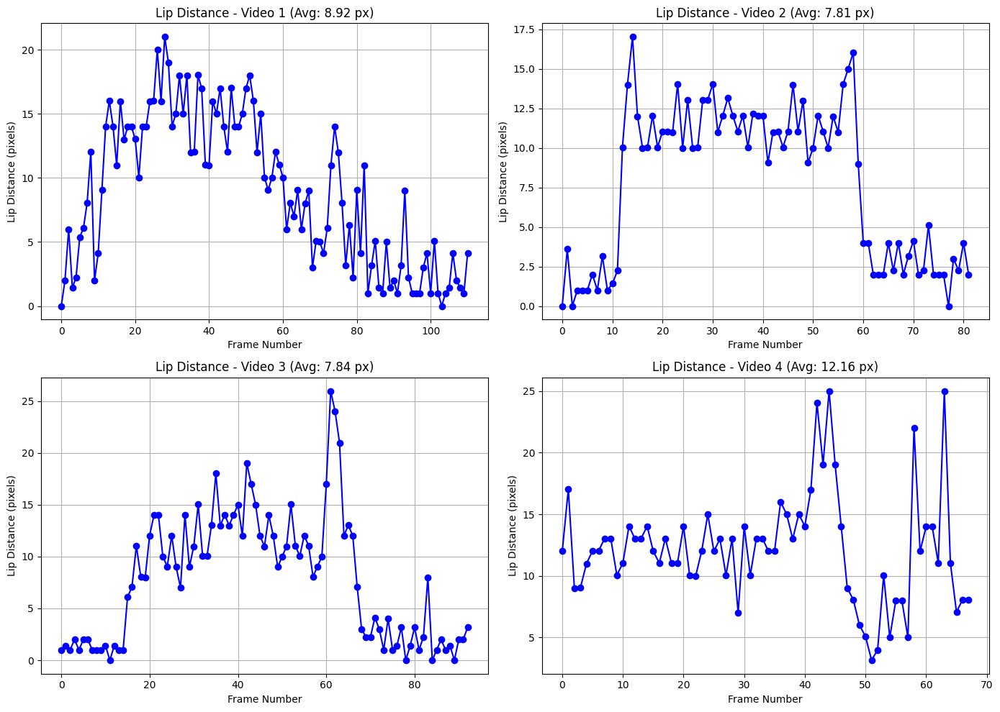

Average Lip Distance for Video 1: 8.92 pixels
Average Lip Distance for Video 2: 7.81 pixels
Average Lip Distance for Video 3: 7.84 pixels
Average Lip Distance for Video 4: 12.16 pixels


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/O_1.mp4',
    '/content/O_2.mp4',
    '/content/O_3.mp4',
    '/content/O_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers and lip distances """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # List to store the lip distances and frame numbers
    lip_distances = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 60):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the distance between upper and lower lips
            upper_lip_point = landmarks.part(62)  # point 62 in the 68-point model
            lower_lip_point = landmarks.part(66)  # point 66 in the 68-point model
            lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                          np.array([lower_lip_point.x, lower_lip_point.y]))

            # Append the frame number and lip distance to the lists
            frame_numbers.append(frame_number)
            lip_distances.append(lip_distance)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_distances

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store average lip distances
average_lip_distances = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_distances = process_video(video_path)

    # Calculate the average lip distance for the video
    avg_lip_distance = np.mean(lip_distances)
    average_lip_distances.append(avg_lip_distance)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_distances, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Distance (pixels)')
    ax.set_title(f'Lip Distance - Video {idx + 1} (Avg: {avg_lip_distance:.2f} px)')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Print the average lip distances for each video
for idx, avg_dist in enumerate(average_lip_distances):
    print(f'Average Lip Distance for Video {idx + 1}: {avg_dist:.2f} pixels')



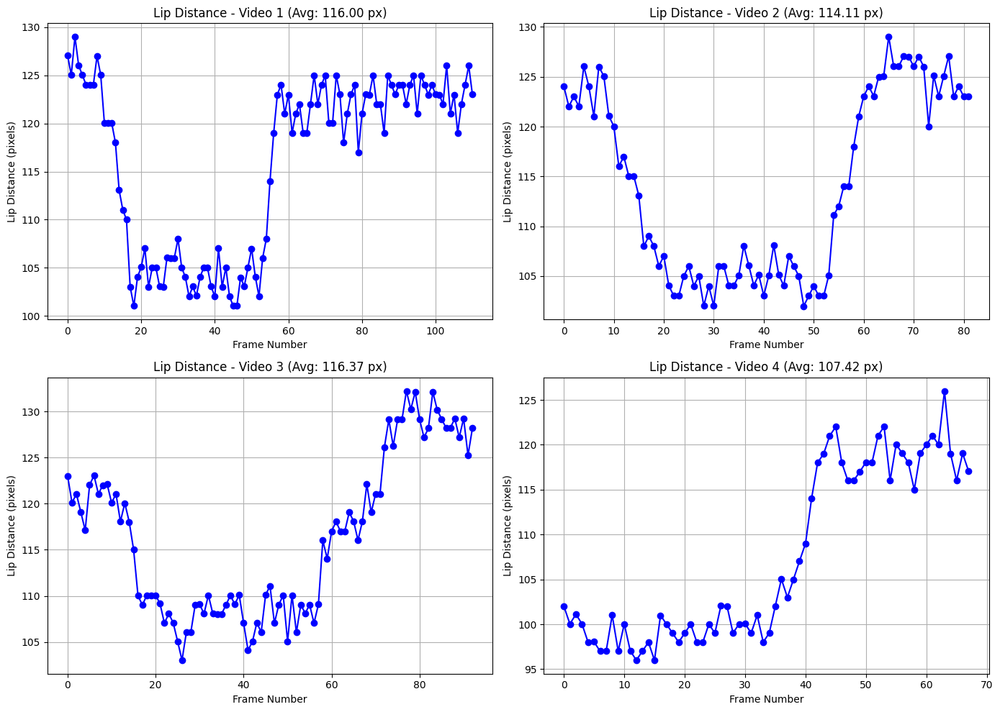

Average Lip Distance for Video 1: 116.00 pixels
Average Lip Distance for Video 2: 114.11 pixels
Average Lip Distance for Video 3: 116.37 pixels
Average Lip Distance for Video 4: 107.42 pixels


In [ ]:
#########horizontal lip distance###############
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/O_1.mp4',
    '/content/O_2.mp4',
    '/content/O_3.mp4',
    '/content/O_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers and lip distances """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # List to store the lip distances and frame numbers
    lip_distances = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 60):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the distance between upper and lower lips
            upper_lip_point = landmarks.part(64)  # point 62 in the 68-point model
            lower_lip_point = landmarks.part(60)  # point 66 in the 68-point model
            lip_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                          np.array([lower_lip_point.x, lower_lip_point.y]))

            # Append the frame number and lip distance to the lists
            frame_numbers.append(frame_number)
            lip_distances.append(lip_distance)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_distances

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store average lip distances
average_lip_distances = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_distances = process_video(video_path)

    # Calculate the average lip distance for the video
    avg_lip_distance = np.mean(lip_distances)
    average_lip_distances.append(avg_lip_distance)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_distances, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Distance (pixels)')
    ax.set_title(f'Lip Distance - Video {idx + 1} (Avg: {avg_lip_distance:.2f} px)')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Print the average lip distances for each video
for idx, avg_dist in enumerate(average_lip_distances):
    print(f'Average Lip Distance for Video {idx + 1}: {avg_dist:.2f} pixels')



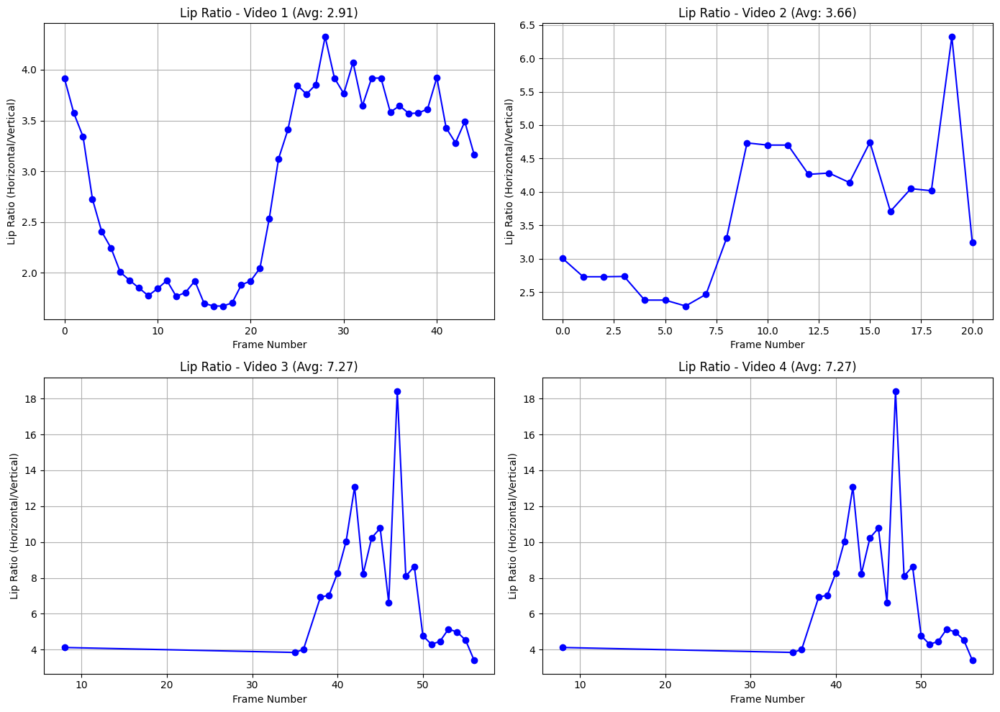

Average Lip Ratio for Video 1: 2.91
Average Lip Ratio for Video 2: 3.66
Average Lip Ratio for Video 3: 7.27
Average Lip Ratio for Video 4: 7.27


In [ ]:
######ration fo horizontal to vertical distance##########
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/N_5.mp4',
    '/content/N_6.mp4',
    '/content/N_7.mp4',
    '/content/N_7.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 68):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the horizontal distance (between points 48 and 54 - the corners of the mouth)
            left_lip_point = landmarks.part(64)  # point 48 (left corner)
            right_lip_point = landmarks.part(60)  # point 54 (right corner)
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Calculate the vertical distance (between points 62 and 66 - upper and lower lips)
            upper_lip_point = landmarks.part(62)  # point 62 (upper lip)
            lower_lip_point = landmarks.part(66)  # point 66 (lower lip)
            vertical_distance = np.linalg.norm(np.array([upper_lip_point.x, upper_lip_point.y]) -
                                               np.array([lower_lip_point.x, lower_lip_point.y]))

            # Calculate the ratio of horizontal to vertical lip distance
            if vertical_distance != 0:  # Avoid division by zero
                lip_ratio = horizontal_distance / vertical_distance
            else:
                lip_ratio = 0  # Set ratio to 0 if vertical distance is 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store average lip ratios
average_lip_ratios = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_ratios = process_video(video_path)

    # Calculate the average lip ratio for the video
    avg_lip_ratio = np.mean(lip_ratios)
    average_lip_ratios.append(avg_lip_ratio)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Ratio (Horizontal/Vertical)')
    ax.set_title(f'Lip Ratio - Video {idx + 1} (Avg: {avg_lip_ratio:.2f})')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Print the average lip ratios for each video
for idx, avg_ratio in enumerate(average_lip_ratios):
    print(f'Average Lip Ratio for Video {idx + 1}: {avg_ratio:.2f}')


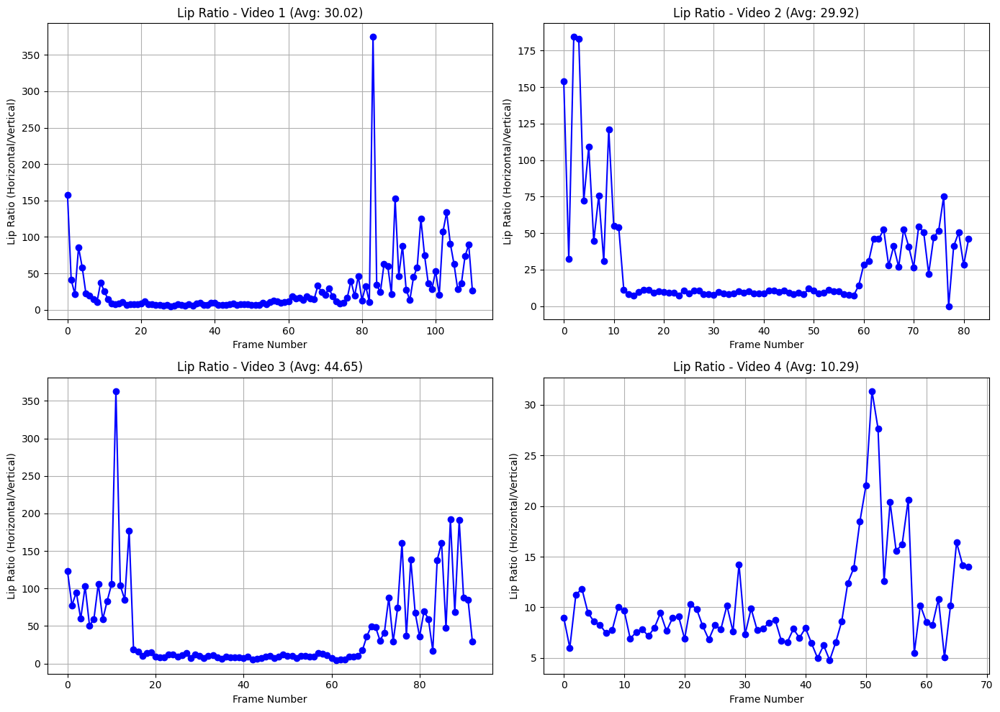

Average Lip Ratio for Video 1: 30.02
Average Lip Ratio for Video 2: 29.92
Average Lip Ratio for Video 3: 44.65
Average Lip Ratio for Video 4: 10.29


In [ ]:
#########Horizontal distance ration with three pairs of vertical distance avg
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/O_1.mp4',
    '/content/O_2.mp4',
    '/content/O_3.mp4',
    '/content/O_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 68):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the horizontal distance (between points 48 and 54 - the corners of the mouth)
            left_lip_point = landmarks.part(60)  # point 48 (left corner)
            right_lip_point = landmarks.part(64)  # point 54 (right corner)
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Calculate the vertical distances between the specified points
            vertical_distances = []

            # Vertical distance between points 61 and 67
            vertical_distance_61_67 = np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y]))
            vertical_distances.append(vertical_distance_61_67)

            # Vertical distance between points 62 and 66
            vertical_distance_62_66 = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y]))
            vertical_distances.append(vertical_distance_62_66)

            # Vertical distance between points 63 and 65
            vertical_distance_63_65 = np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y]))
            vertical_distances.append(vertical_distance_63_65)

            # Calculate the average of these vertical distances
            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            if avg_vertical_distance != 0:  # Avoid division by zero
                lip_ratio = horizontal_distance / avg_vertical_distance
            else:
                lip_ratio = 0  # Set ratio to 0 if vertical distance is 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store average lip ratios
average_lip_ratios = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_ratios = process_video(video_path)

    # Calculate the average lip ratio for the video
    avg_lip_ratio = np.mean(lip_ratios)
    average_lip_ratios.append(avg_lip_ratio)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Ratio (Horizontal/Vertical)')
    ax.set_title(f'Lip Ratio - Video {idx + 1} (Avg: {avg_lip_ratio:.2f})')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Print the average lip ratios for each video
for idx, avg_ratio in enumerate(average_lip_ratios):
    print(f'Average Lip Ratio for Video {idx + 1}: {avg_ratio:.2f}')


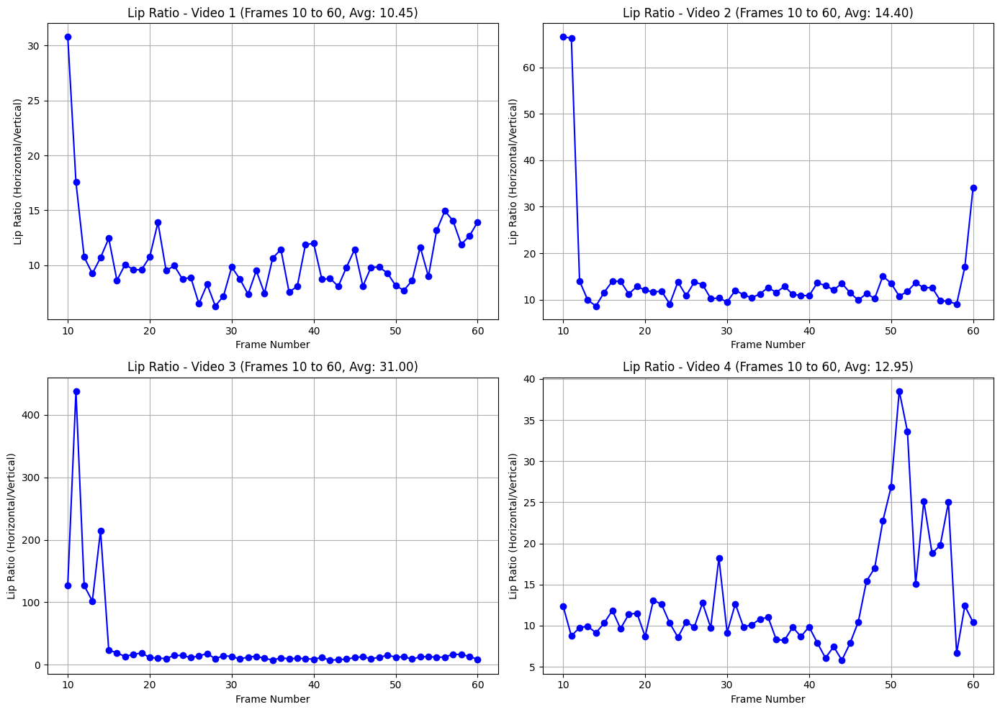

Average Lip Ratio for Video 1 (Frames 10 to 60): 10.45
Average Lip Ratio for Video 2 (Frames 10 to 60): 14.40
Average Lip Ratio for Video 3 (Frames 10 to 60): 31.00
Average Lip Ratio for Video 4 (Frames 10 to 60): 12.95


In [ ]:
##########between frame 10 to 60#########
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/O_1.mp4',
    '/content/O_2.mp4',
    '/content/O_3.mp4',
    '/content/O_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 68):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the horizontal distance (between points 48 and 54 - the corners of the mouth)
            left_lip_point = landmarks.part(48)  # point 48 (left corner)
            right_lip_point = landmarks.part(54)  # point 54 (right corner)
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Calculate the vertical distances between the specified points
            vertical_distances = []

            # Vertical distance between points 61 and 67
            vertical_distance_61_67 = np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y]))
            vertical_distances.append(vertical_distance_61_67)

            # Vertical distance between points 62 and 66
            vertical_distance_62_66 = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y]))
            vertical_distances.append(vertical_distance_62_66)

            # Vertical distance between points 63 and 65
            vertical_distance_63_65 = np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y]))
            vertical_distances.append(vertical_distance_63_65)

            # Calculate the average of these vertical distances
            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            if avg_vertical_distance != 0:  # Avoid division by zero
                lip_ratio = horizontal_distance / avg_vertical_distance
            else:
                lip_ratio = 0  # Set ratio to 0 if vertical distance is 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store average lip ratios
average_lip_ratios = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_ratios = process_video(video_path)

    # Filter to show results for frames 10 to 60
    frame_numbers = frame_numbers[10:61]
    lip_ratios = lip_ratios[10:61]

    # Calculate the average lip ratio for the filtered frames
    avg_lip_ratio = np.mean(lip_ratios)
    average_lip_ratios.append(avg_lip_ratio)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Ratio (Horizontal/Vertical)')
    ax.set_title(f'Lip Ratio - Video {idx + 1} (Frames 10 to 60, Avg: {avg_lip_ratio:.2f})')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Print the average lip ratios for each video (for frames 10 to 60)
for idx, avg_ratio in enumerate(average_lip_ratios):
    print(f'Average Lip Ratio for Video {idx + 1} (Frames 10 to 60): {avg_ratio:.2f}')


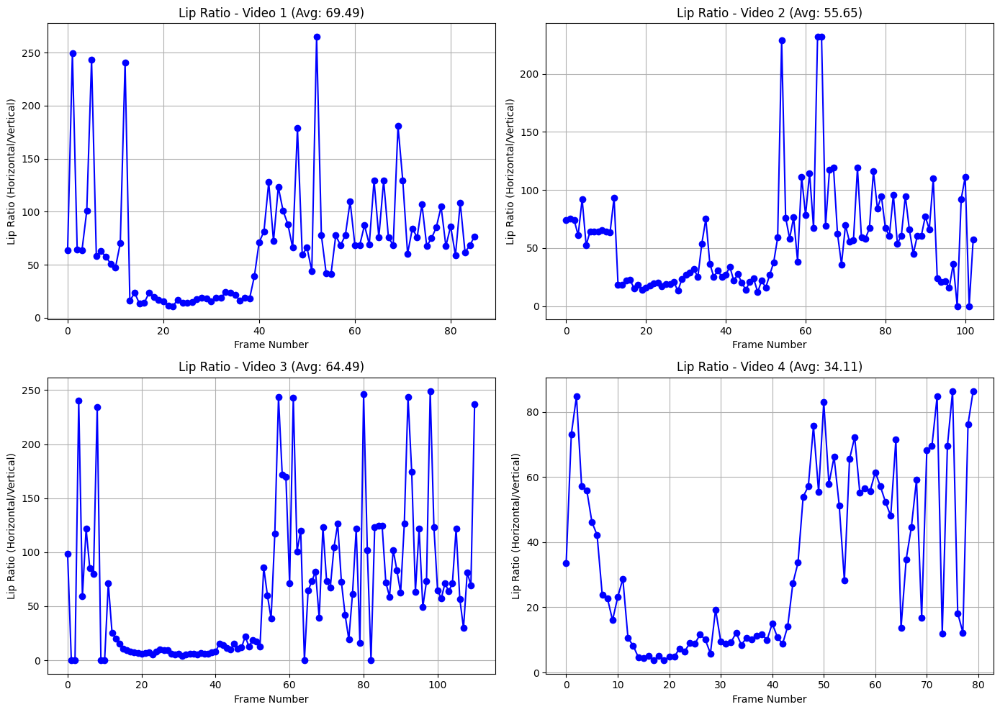

Average Lip Ratio for Video 1: 69.49
Average Lip Ratio for Video 2: 55.65
Average Lip Ratio for Video 3: 64.49
Average Lip Ratio for Video 4: 34.11


In [ ]:
#########Horizontal distance ration with three pairs of vertical distance avg
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/N_1.mp4',
    '/content/N_2.mp4',
    '/content/N_3.mp4',
    '/content/N_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Extract lip coordinates (the mouth region is from points 48 to 67)
            lip_points = []
            for i in range(48, 68):
                x = landmarks.part(i).x
                y = landmarks.part(i).y
                lip_points.append((x, y))

            # Convert the points to a numpy array
            lip_points = np.array(lip_points)

            # Calculate the horizontal distance (between points 48 and 54 - the corners of the mouth)
            left_lip_point = landmarks.part(60)  # point 48 (left corner)
            right_lip_point = landmarks.part(64)  # point 54 (right corner)
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Calculate the vertical distances between the specified points
            vertical_distances = []

            # Vertical distance between points 61 and 67
            vertical_distance_61_67 = np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y]))
            vertical_distances.append(vertical_distance_61_67)

            # Vertical distance between points 62 and 66
            vertical_distance_62_66 = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y]))
            vertical_distances.append(vertical_distance_62_66)

            # Vertical distance between points 63 and 65
            vertical_distance_63_65 = np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y]))
            vertical_distances.append(vertical_distance_63_65)

            # Calculate the average of these vertical distances
            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            if avg_vertical_distance != 0:  # Avoid division by zero
                lip_ratio = horizontal_distance / avg_vertical_distance
            else:
                lip_ratio = 0  # Set ratio to 0 if vertical distance is 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store average lip ratios
average_lip_ratios = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_ratios = process_video(video_path)

    # Calculate the average lip ratio for the video
    avg_lip_ratio = np.mean(lip_ratios)
    average_lip_ratios.append(avg_lip_ratio)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Ratio (Horizontal/Vertical)')
    ax.set_title(f'Lip Ratio - Video {idx + 1} (Avg: {avg_lip_ratio:.2f})')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Print the average lip ratios for each video
for idx, avg_ratio in enumerate(average_lip_ratios):
    print(f'Average Lip Ratio for Video {idx + 1}: {avg_ratio:.2f}')


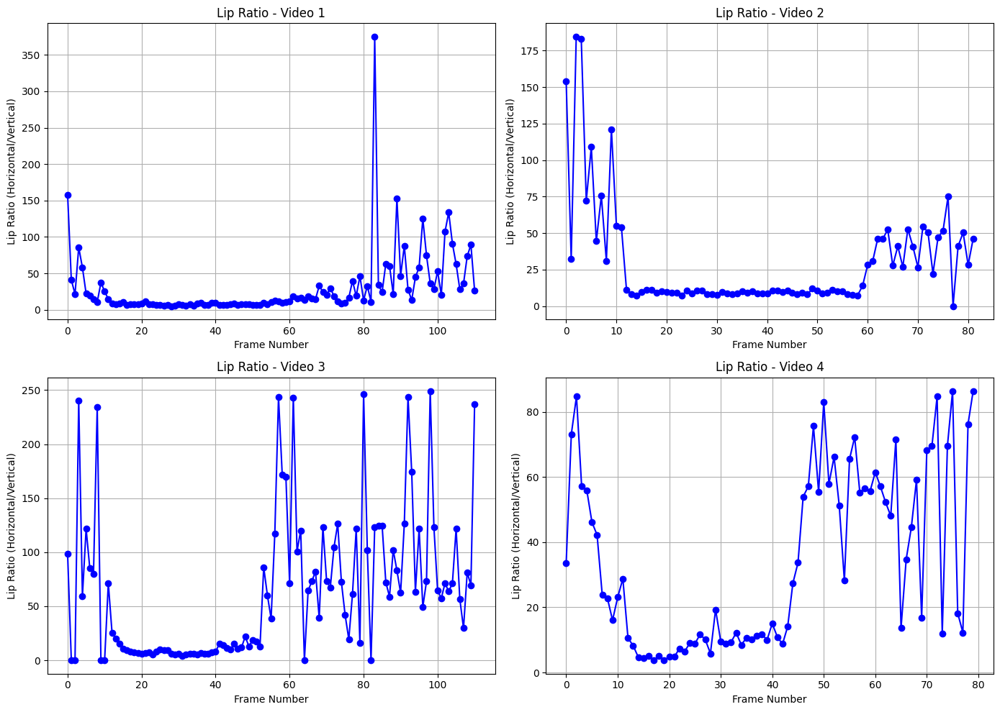

Pearson Correlation between Video 1 and Video 2: 0.69
Pearson Correlation between Video 1 and Video 3: 0.21
Pearson Correlation between Video 1 and Video 4: 0.21
Pearson Correlation between Video 2 and Video 3: 0.28
Pearson Correlation between Video 2 and Video 4: 0.34
Pearson Correlation between Video 3 and Video 4: 0.35


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.stats import pearsonr  # Import Pearson correlation

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_paths = [
    '/content/O_1.mp4',
    '/content/O_2.mp4',
    '/content/N_3.mp4',
    '/content/N_4.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            vertical_distances = []
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y])))

            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            lip_ratio = horizontal_distance / avg_vertical_distance if avg_vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Create subplots for 4 videos
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns

# List to store lip ratios from each video
lip_ratios_list = []

# Iterate through each video and process it
for idx, video_path in enumerate(video_paths):
    frame_numbers, lip_ratios = process_video(video_path)

    # Store lip ratios for each video
    lip_ratios_list.append(lip_ratios)

    # Determine subplot position
    ax = axs[idx // 2, idx % 2]

    # Plot the data
    ax.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Frame Number')
    ax.set_ylabel('Lip Ratio (Horizontal/Vertical)')
    ax.set_title(f'Lip Ratio - Video {idx + 1}')
    ax.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Apply Pearson correlation on the lip ratios between videos
correlation_results = []

# Calculate Pearson correlation for all pairs of videos
for i in range(len(lip_ratios_list)):
    for j in range(i + 1, len(lip_ratios_list)):
        # Truncate both lists to the minimum length
        min_length = min(len(lip_ratios_list[i]), len(lip_ratios_list[j]))
        lip_ratios_i = lip_ratios_list[i][:min_length]
        lip_ratios_j = lip_ratios_list[j][:min_length]

        # Compute correlation between lip ratios of video i and video j
        corr, _ = pearsonr(lip_ratios_i, lip_ratios_j)
        correlation_results.append((i+1, j+1, corr))
        print(f'Pearson Correlation between Video {i+1} and Video {j+1}: {corr:.2f}')


Pearson Correlation between Video 1 and Video 2: 0.75


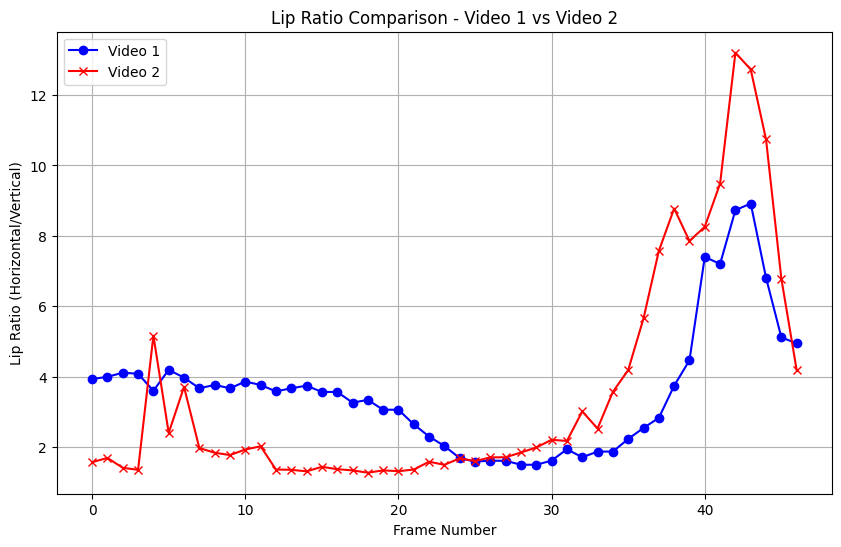

In [ ]:
#############Pearson Correlation between two videos
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.stats import pearsonr  # Import Pearson correlation

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the two MP4 video files
video_1_path = '/content/O_5.mp4'
video_2_path = '/content/O_6.mp4'

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            vertical_distances = []
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y])))

            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            lip_ratio = horizontal_distance / avg_vertical_distance if avg_vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the two videos
frame_numbers_1, lip_ratios_1 = process_video(video_1_path)
frame_numbers_2, lip_ratios_2 = process_video(video_2_path)

# Truncate both lists to the minimum length
min_length = min(len(lip_ratios_1), len(lip_ratios_2))
lip_ratios_1 = lip_ratios_1[:min_length]
lip_ratios_2 = lip_ratios_2[:min_length]

# Calculate Pearson correlation between the two videos
corr, _ = pearsonr(lip_ratios_1, lip_ratios_2)
print(f'Pearson Correlation between Video 1 and Video 2: {corr:.2f}')

# Plot the lip ratios of both videos for comparison
plt.figure(figsize=(10, 6))
plt.plot(range(min_length), lip_ratios_1, marker='o', linestyle='-', color='b', label='Video 1')
plt.plot(range(min_length), lip_ratios_2, marker='x', linestyle='-', color='r', label='Video 2')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio (Horizontal/Vertical)')
plt.title('Lip Ratio Comparison - Video 1 vs Video 2')
plt.legend()
plt.grid(True)
plt.show()


Pearson Correlation between Video 1 and Video 2: 0.23
Pearson Correlation between Video 1 and Video 3: -0.58
Pearson Correlation between Video 2 and Video 3: -0.05


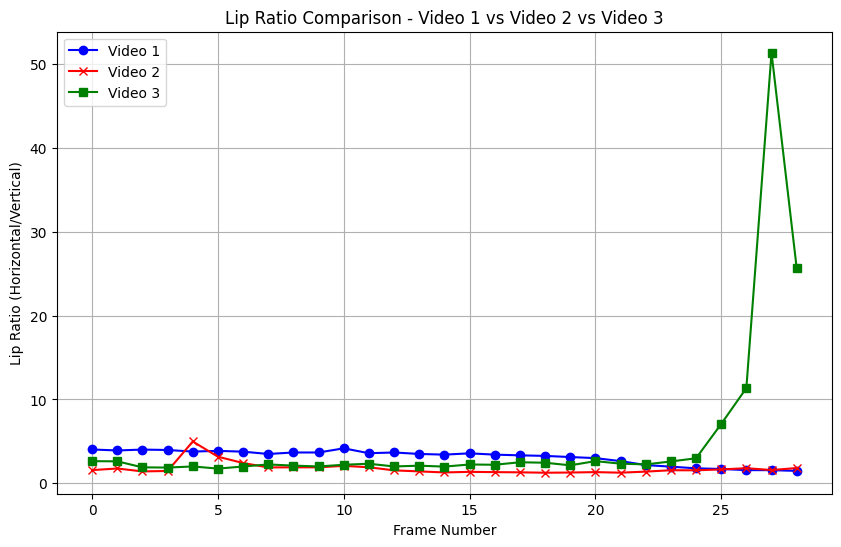

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.stats import pearsonr  # Import Pearson correlation

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the three MP4 video files
video_1_path = '/content/O_5 _0.5_speed.mp4'
video_2_path = '/content/O_6 _0.5_speed.mp4'
video_3_path = '/content/O_7_0.5_speed.mp4'

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            vertical_distances = []
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y])))

            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            lip_ratio = horizontal_distance / avg_vertical_distance if avg_vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the three videos
frame_numbers_1, lip_ratios_1 = process_video(video_1_path)
frame_numbers_2, lip_ratios_2 = process_video(video_2_path)
frame_numbers_3, lip_ratios_3 = process_video(video_3_path)

# Truncate all lists to the minimum length
min_length = min(len(lip_ratios_1), len(lip_ratios_2), len(lip_ratios_3))
lip_ratios_1 = lip_ratios_1[:min_length]
lip_ratios_2 = lip_ratios_2[:min_length]
lip_ratios_3 = lip_ratios_3[:min_length]

# Calculate Pearson correlation between the videos
corr_1_2, _ = pearsonr(lip_ratios_1, lip_ratios_2)
corr_1_3, _ = pearsonr(lip_ratios_1, lip_ratios_3)
corr_2_3, _ = pearsonr(lip_ratios_2, lip_ratios_3)

print(f'Pearson Correlation between Video 1 and Video 2: {corr_1_2:.2f}')
print(f'Pearson Correlation between Video 1 and Video 3: {corr_1_3:.2f}')
print(f'Pearson Correlation between Video 2 and Video 3: {corr_2_3:.2f}')

# Plot the lip ratios of all three videos for comparison
plt.figure(figsize=(10, 6))
plt.plot(range(min_length), lip_ratios_1, marker='o', linestyle='-', color='b', label='Video 1')
plt.plot(range(min_length), lip_ratios_2, marker='x', linestyle='-', color='r', label='Video 2')
plt.plot(range(min_length), lip_ratios_3, marker='s', linestyle='-', color='g', label='Video 3')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio (Horizontal/Vertical)')
plt.title('Lip Ratio Comparison - Video 1 vs Video 2 vs Video 3')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from skimage.metrics import structural_similarity as ssim  # Import SSIM

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the four MP4 video files
video_1_path = '/content/O_5 _0.5_speed.mp4'
video_2_path = '/content/O_6 _0.5_speed.mp4'
video_3_path = '/content/O_7_0.5_speed.mp4'
video_4_path = '/content/O_4.mp4'  # Add the fourth video path

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            vertical_distances = []
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(61).x, landmarks.part(61).y]) -
                                                     np.array([landmarks.part(67).x, landmarks.part(67).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y])))
            vertical_distances.append(np.linalg.norm(np.array([landmarks.part(63).x, landmarks.part(63).y]) -
                                                     np.array([landmarks.part(65).x, landmarks.part(65).y])))

            avg_vertical_distance = np.mean(vertical_distances)

            # Calculate the ratio of horizontal to average vertical lip distance
            lip_ratio = horizontal_distance / avg_vertical_distance if avg_vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the four videos
frame_numbers_1, lip_ratios_1 = process_video(video_1_path)
frame_numbers_2, lip_ratios_2 = process_video(video_2_path)
frame_numbers_3, lip_ratios_3 = process_video(video_3_path)
frame_numbers_4, lip_ratios_4 = process_video(video_4_path)  # Process the fourth video

# Truncate all lists to the minimum length
min_length = min(len(lip_ratios_1), len(lip_ratios_2), len(lip_ratios_3), len(lip_ratios_4))
lip_ratios_1 = lip_ratios_1[:min_length]
lip_ratios_2 = lip_ratios_2[:min_length]
lip_ratios_3 = lip_ratios_3[:min_length]
lip_ratios_4 = lip_ratios_4[:min_length]

# Calculate Pearson correlation between all pairwise combinations of the videos
corr_1_2, _ = pearsonr(lip_ratios_1, lip_ratios_2)
corr_1_3, _ = pearsonr(lip_ratios_1, lip_ratios_3)
corr_1_4, _ = pearsonr(lip_ratios_1, lip_ratios_4)
corr_2_3, _ = pearsonr(lip_ratios_2, lip_ratios_3)
corr_2_4, _ = pearsonr(lip_ratios_2, lip_ratios_4)
corr_3_4, _ = pearsonr(lip_ratios_3, lip_ratios_4)

print(f'Pearson Correlation between Video 1 and Video 2: {corr_1_2:.2f}')
print(f'Pearson Correlation between Video 1 and Video 3: {corr_1_3:.2f}')
print(f'Pearson Correlation between Video 1 and Video 4: {corr_1_4:.2f}')
print(f'Pearson Correlation between Video 2 and Video 3: {corr_2_3:.2f}')
print(f'Pearson Correlation between Video 2 and Video 4: {corr_2_4:.2f}')
print(f'Pearson Correlation between Video 3 and Video 4: {corr_3_4:.2f}')

# Calculate SSIM between all pairwise combinations of the videos
data_range = 2.0  # Set data range based on expected range of lip ratios (you can adjust this value)
ssim_1_2 = ssim(np.array(lip_ratios_1), np.array(lip_ratios_2), data_range=data_range)
ssim_1_3 = ssim(np.array(lip_ratios_1), np.array(lip_ratios_3), data_range=data_range)
ssim_1_4 = ssim(np.array(lip_ratios_1), np.array(lip_ratios_4), data_range=data_range)
ssim_2_3 = ssim(np.array(lip_ratios_2), np.array(lip_ratios_3), data_range=data_range)
ssim_2_4 = ssim(np.array(lip_ratios_2), np.array(lip_ratios_4), data_range=data_range)
ssim_3_4 = ssim(np.array(lip_ratios_3), np.array(lip_ratios_4), data_range=data_range)

print(f'SSIM between Video 1 and Video 2: {ssim_1_2:.2f}')
print(f'SSIM between Video 1 and Video 3: {ssim_1_3:.2f}')
print(f'SSIM between Video 1 and Video 4: {ssim_1_4:.2f}')
print(f'SSIM between Video 2 and Video 3: {ssim_2_3:.2f}')
print(f'SSIM between Video 2 and Video 4: {ssim_2_4:.2f}')
print(f'SSIM between Video 3 and Video 4: {ssim_3_4:.2f}')

# Plot the lip ratios of all four videos for comparison
plt.figure(figsize=(10, 6))
plt.plot(range(min_length), lip_ratios_1, marker='o', linestyle='-', color='b', label='Video 1')
plt.plot(range(min_length), lip_ratios_2, marker='x', linestyle='-', color='r', label='Video 2')
plt.plot(range(min_length), lip_ratios_3, marker='s', linestyle='-', color='g', label='Video 3')
plt.plot(range(min_length), lip_ratios_4, marker='d', linestyle='-', color='m', label='Video 4')  # Add Video 4
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio (Horizontal/Vertical)')
plt.title('Lip Ratio Comparison - Video 1 vs Video 2 vs Video 3 vs Video 4')
plt.legend()
plt.grid(True)
plt.show()


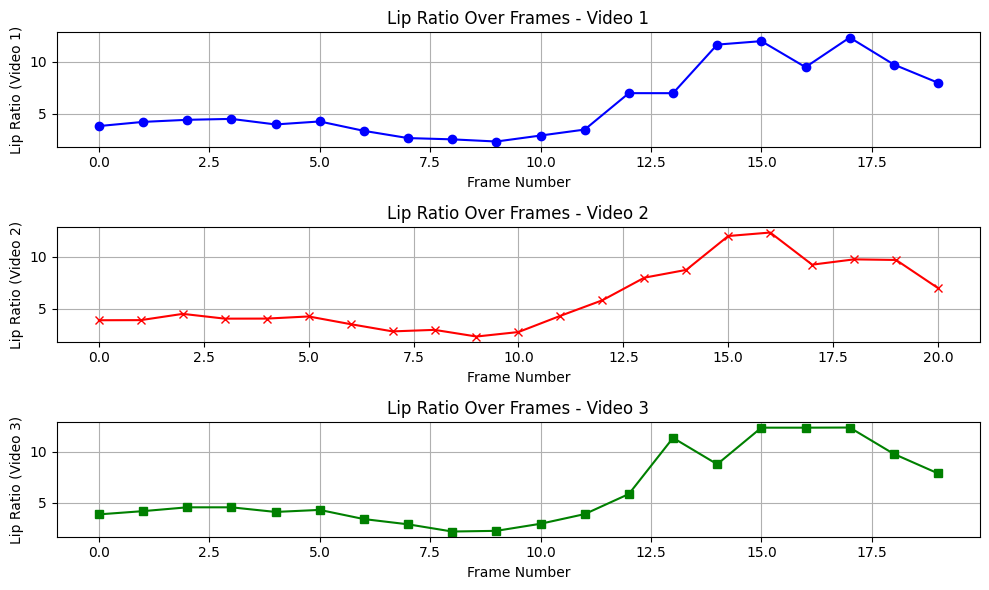

In [ ]:
###########calculating three videos lip ratio graphs########
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the three MP4 video files
video_1_path = '/content/NO_1_0.5_speed.mp4'
video_2_path = '/content/NO_1.mp4'
video_3_path = '/content/NO_1_1.25_speed.mp4'

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    # Process all frames in the video
    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Use only one vertical distance (between points 62 and 66)
            vertical_distance = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                               np.array([landmarks.part(66).x, landmarks.part(66).y]))

            # Calculate the ratio of horizontal to vertical lip distance
            lip_ratio = horizontal_distance / vertical_distance if vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the three videos
frame_numbers_1, lip_ratios_1 = process_video(video_1_path)
frame_numbers_2, lip_ratios_2 = process_video(video_2_path)
frame_numbers_3, lip_ratios_3 = process_video(video_3_path)

# Plot each video’s lip ratios on separate graphs
plt.figure(figsize=(10, 6))

# Graph for Video 1
plt.subplot(3, 1, 1)
plt.plot(frame_numbers_1, lip_ratios_1, marker='o', linestyle='-', color='b')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio (Video 1)')
plt.title('Lip Ratio Over Frames - Video 1')
plt.grid(True)

# Graph for Video 2
plt.subplot(3, 1, 2)
plt.plot(frame_numbers_2, lip_ratios_2, marker='x', linestyle='-', color='r')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio (Video 2)')
plt.title('Lip Ratio Over Frames - Video 2')
plt.grid(True)

# Graph for Video 3
plt.subplot(3, 1, 3)
plt.plot(frame_numbers_3, lip_ratios_3, marker='s', linestyle='-', color='g')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio (Video 3)')
plt.title('Lip Ratio Over Frames - Video 3')
plt.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


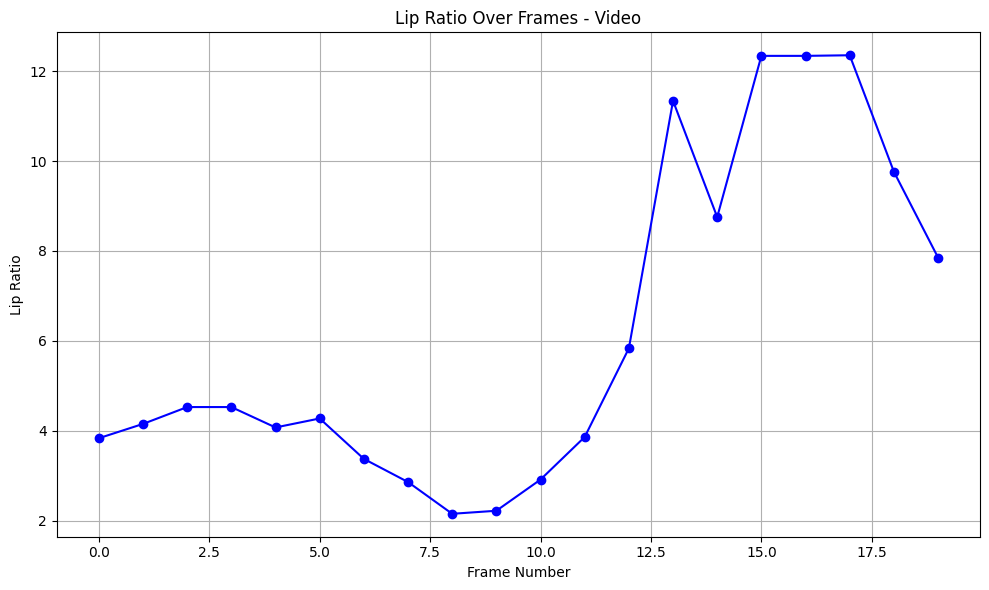

In [ ]:
import cv2
import dlib
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Path to the MP4 video file
video_path = '/content/NO_1_1.25_speed.mp4'

def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    # Process all frames in the video
    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Use only one vertical distance (between points 62 and 66)
            vertical_distance = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                               np.array([landmarks.part(66).x, landmarks.part(66).y]))

            # Calculate the ratio of horizontal to vertical lip distance
            lip_ratio = horizontal_distance / vertical_distance if vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the video
frame_numbers, lip_ratios = process_video(video_path)

# Plot the lip ratios over frames
plt.figure(figsize=(10, 6))
plt.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', color='b')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio')
plt.title('Lip Ratio Over Frames - Video')
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


Error: Could not open video path


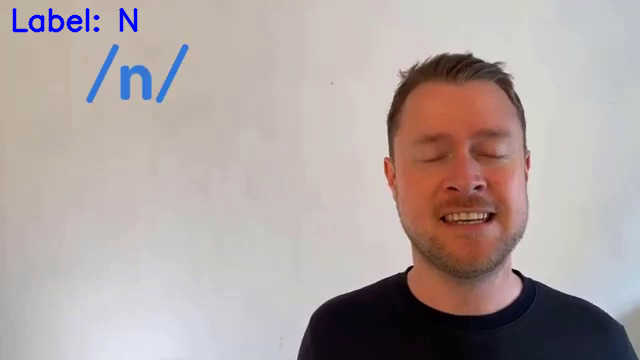

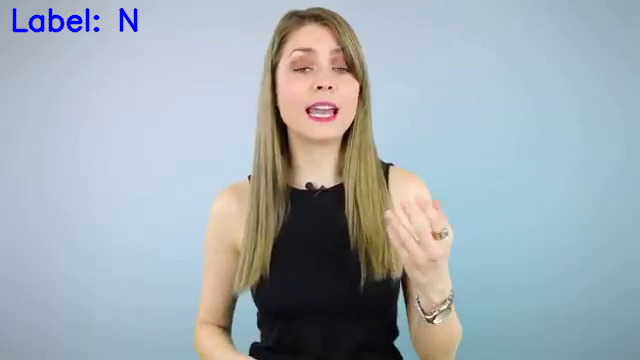

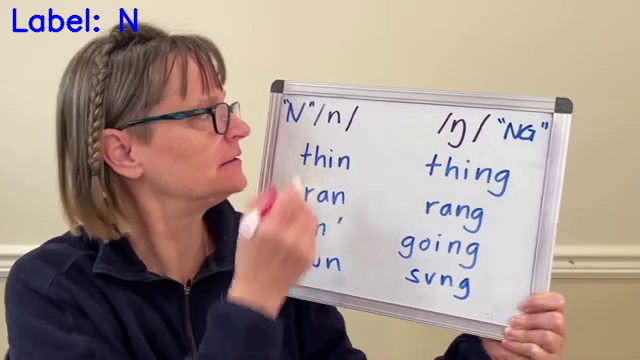

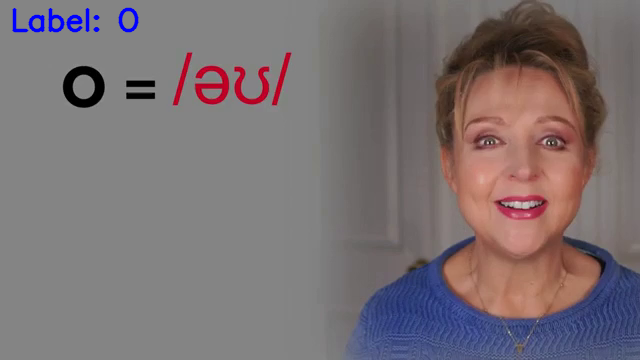

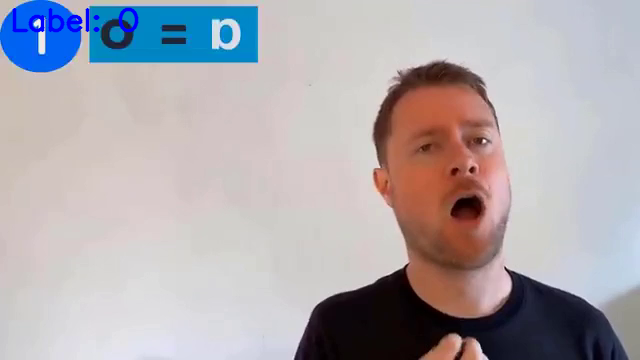

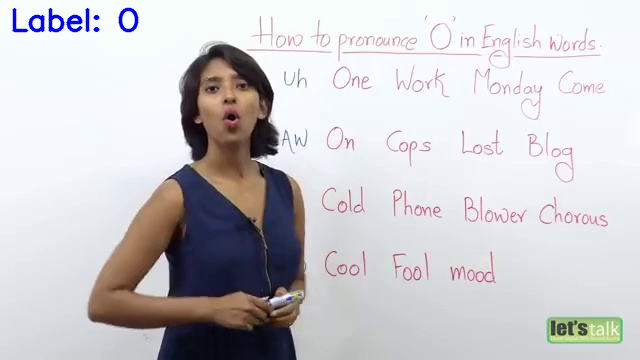

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Define the annotation file path
annotation_file = "/content/annotation.txt"

# Function to read annotation file and return the path and label
def read_annotation(file_name):
    with open(file_name, 'r') as file:
        for line in file:
            path, label = line.strip().split(",")
            yield path, label

# Loop through each path and label in the annotation file
for video_path, label in read_annotation(annotation_file):

    # Capture the video
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        continue

    # Display video frame by frame
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Add label as text to the frame
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame, f"Label: {label}", (10, 30), font, 1, (255, 0, 0), 2, cv2.LINE_AA)

        # Show the frame using cv2_imshow (since cv2.imshow is disabled in Colab)
        cv2_imshow(frame)

        # Break after each frame (adjust this as needed)
        break  # To just show one frame, remove this if you want to loop through the entire video.

    # Release video capture
    cap.release()


In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Set the dataset directory to your Google Drive folder
DATASET_DIR = '/content/drive/MyDrive/data set'  # Update this if your dataset is located elsewhere

# Check if the dataset directory exists
import os
if os.path.exists(DATASET_DIR):
    print(f"Dataset directory found at: {DATASET_DIR}")
else:
    print(f"Dataset directory not found. Please check the path: {DATASET_DIR}")


Mounted at /content/drive
Dataset directory found at: /content/drive/MyDrive/data set


In [ ]:
#########training and testing#############
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical

IMG_SIZE = 64  # Image size for resizing
NUM_CLASSES = len([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])  # Only count directories

def extract_frames_from_video(video_path, num_frames=20):
    cap = cv2.VideoCapture(video_path)
    frames = []
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_step = max(1, total_frames // num_frames)

    for i in range(0, total_frames, frame_step):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if ret:
            frame = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))  # Resize to (64, 64)
            frame = frame / 255.0  # Normalize
            frames.append(frame)
        else:
            break

    cap.release()
    return np.array(frames)

def load_data(dataset_dir, num_frames=20):
    data = []
    labels = []

    for label, letter_dir in enumerate(sorted(os.listdir(dataset_dir))):
        letter_dir_path = os.path.join(dataset_dir, letter_dir)

        # Check if it is a directory
        if os.path.isdir(letter_dir_path):
            for video_file in os.listdir(letter_dir_path):
                video_path = os.path.join(letter_dir_path, video_file)

                # Only process video files (you can filter extensions if necessary)
                if video_file.endswith(('.mp4', '.avi', '.mkv')):  # Adjust the extensions as per your files
                    frames = extract_frames_from_video(video_path, num_frames=num_frames)
                    if frames.shape[0] == num_frames:
                        data.append(frames)
                        labels.append(label)

    data = np.array(data)
    labels = to_categorical(labels, num_classes=NUM_CLASSES)
    return data, labels

# Load data from your Google Drive dataset folder
X, y = load_data(DATASET_DIR, num_frames=20)

# Split into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape}, Testing samples: {X_test.shape}")


Training samples: (2, 20, 64, 64, 3), Testing samples: (1, 20, 64, 64, 3)


In [ ]:
##########Preprocess the dataset###############
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical

# Paths
DATASET_DIR = '/content/drive/MyDrive/data set'  # Change this to your dataset directory
IMG_SIZE = 64  # Image size for resizing
NUM_CLASSES = len(os.listdir(DATASET_DIR))  # Assuming one folder per letter

def extract_frames_from_video(video_path, num_frames=20):
    """
    Extract frames from the video, resize them, and return them as a list of images.
    """
    cap = cv2.VideoCapture(video_path)
    frames = []
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_step = max(1, total_frames // num_frames)

    for i in range(0, total_frames, frame_step):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if ret:
            frame = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))  # Resize to (64, 64)
            frame = frame / 255.0  # Normalize
            frames.append(frame)
        else:
            break

    cap.release()
    return np.array(frames)

def load_data(dataset_dir, num_frames=20):
    """
    Load video data from dataset directory, return data and labels.
    """
    data = []
    labels = []

    for label, letter_dir in enumerate(sorted(os.listdir(dataset_dir))):
        letter_dir_path = os.path.join(dataset_dir, letter_dir)
        for video_file in os.listdir(letter_dir_path):
            video_path = os.path.join(letter_dir_path, video_file)
            frames = extract_frames_from_video(video_path, num_frames=num_frames)
            if frames.shape[0] == num_frames:
                data.append(frames)
                labels.append(label)

    data = np.array(data)
    labels = to_categorical(labels, num_classes=NUM_CLASSES)
    return data, labels

# Load data
X, y = load_data(DATASET_DIR, num_frames=20)

# Split into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape}, Testing samples: {X_test.shape}")


Training samples: (2, 20, 64, 64, 3), Testing samples: (1, 20, 64, 64, 3)


In [ ]:
#############building the model#######
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import TimeDistributed, Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout

# Build the model
def build_model(input_shape, num_classes):
    model = Sequential()

    # CNN layers for feature extraction
    model.add(TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'), input_shape=input_shape))
    model.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))

    model.add(TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same')))
    model.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))

    model.add(TimeDistributed(Flatten()))

    # LSTM layers for temporal sequence learning
    model.add(LSTM(64, return_sequences=False))

    # Fully connected layer
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))

    # Output layer
    model.add(Dense(num_classes, activation='softmax'))

    return model

input_shape = (20, IMG_SIZE, IMG_SIZE, 3)  # 20 frames, 64x64 image size, 3 color channels
model = build_model(input_shape, NUM_CLASSES)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

# Save the model
model.save('lip_reading_model.h5')


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step - accuracy: 0.0000e+00 - loss: 1.1555 - val_accuracy: 0.0000e+00 - val_loss: 2.0970
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 1.0000 - loss: 0.4247 - val_accuracy: 0.0000e+00 - val_loss: 2.6355
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 1.0000 - loss: 0.1627 - val_accuracy: 0.0000e+00 - val_loss: 2.8837
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 1.0000 - loss: 0.0448 - val_accuracy: 0.0000e+00 - val_loss: 3.0610
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 1.0000 - loss: 0.1441 - val_accuracy: 0.0000e+00 - val_loss: 3.2385
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 1.0000 - loss: 0.0458 - val_accuracy: 0.0000e+00 - val_loss: 3.3916
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 1.0000 - loss: 0.0323 - val_accuracy: 0.0000e+00 - val_loss: 3.5173
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 1.0000 - loss: 0.0496 - v

In [ ]:
#############evaluate the model############
# Load the saved model
model = tf.keras.models.load_model('lip_reading_model.h5')

# Evaluate on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc * 100:.2f}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.0000e+00 - loss: 4.9901
Test accuracy: 0.00%


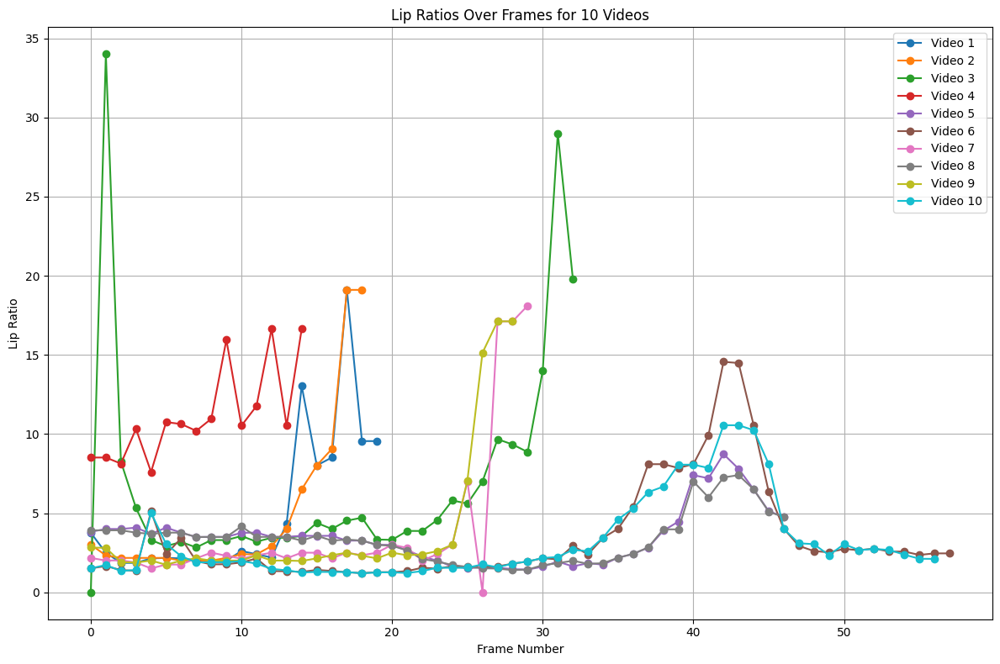

In [ ]:
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

# Path to the shape predictor model
predictor_path = "/content/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the ten MP4 video files
video_paths = [
    '/content/drive/MyDrive/data set/O/O_8.mp4',
    '/content/drive/MyDrive/data set/O/O_8_0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_9.mp4',
    '/content/drive/MyDrive/data set/O/O_10.mp4',
    '/content/drive/MyDrive/data set/O/O_5.mp4',
    '/content/drive/MyDrive/data set/O/O_6.mp4',
    '/content/drive/MyDrive/data set/O/O_7.mp4',
    '/content/drive/MyDrive/data set/O/O_5 _0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_7_0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_6 _0.5_speed.mp4'
]
def process_video(video_path):
    """ Process a video and return frame numbers, lip distances, and the horizontal/vertical ratio """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    # Process all frames in the video
    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Use only one vertical distance (between points 62 and 66)
            vertical_distance = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                               np.array([landmarks.part(66).x, landmarks.part(66).y]))

            # Calculate the ratio of horizontal to vertical lip distance
            lip_ratio = horizontal_distance / vertical_distance if vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the ten videos and store the results
results = []
for video_path in video_paths:
    frames, ratios = process_video(video_path)
    results.append((frames, ratios))

# Plot all videos’ lip ratios on one graph
plt.figure(figsize=(12, 8))

# Iterate over results and plot each video's data
for idx, (frame_numbers, lip_ratios) in enumerate(results):
    plt.plot(frame_numbers, lip_ratios, marker='o', linestyle='-', label=f'Video {idx + 1}')

# Add labels and title
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio')
plt.title('Lip Ratios Over Frames for 10 Videos')
plt.legend(loc='upper right')
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


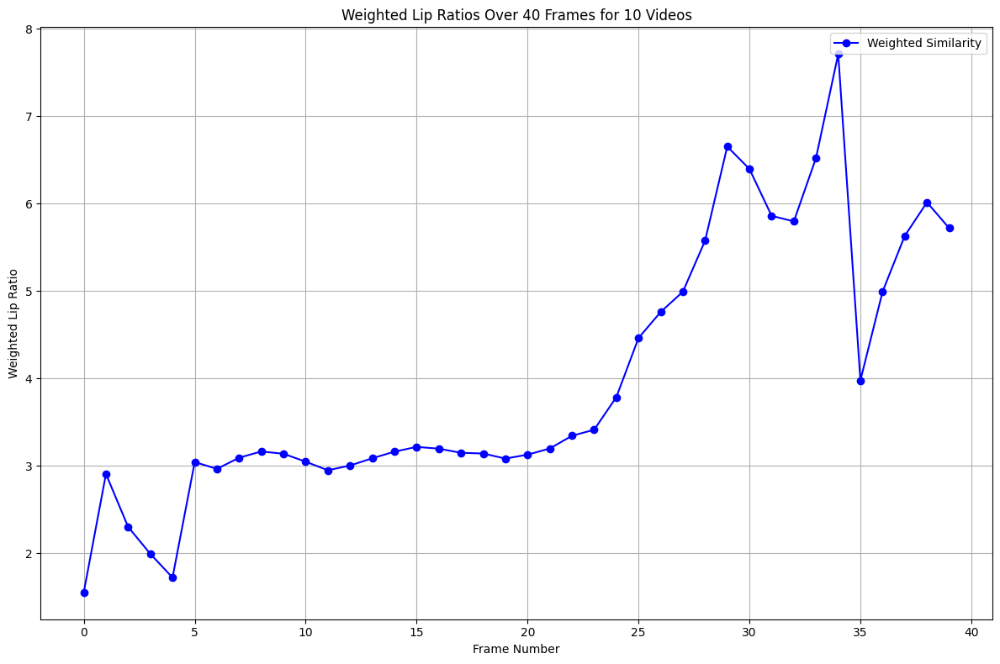

In [ ]:
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Path to the shape predictor model
predictor_path = "/content/drive/MyDrive/data set/shape_predictor_68_face_landmarks.dat"

# Check if the file exists
import os
if not os.path.exists(predictor_path):
    raise FileNotFoundError(f"The predictor file {predictor_path} was not found. Please check the path and try again.")

# Initialize dlib's face detector (HOG-based) and the facial landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

# Paths to the ten MP4 video files
video_paths = [
    '/content/drive/MyDrive/data set/O/O_5 _0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_5.mp4',
    '/content/drive/MyDrive/data set/O/O_6.mp4',
    '/content/drive/MyDrive/data set/O/O_6 _0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_7.mp4',
    '/content/drive/MyDrive/data set/O/O_7_0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_8.mp4',
    '/content/drive/MyDrive/data set/O/O_8_0.5_speed.mp4',
    '/content/drive/MyDrive/data set/O/O_9.mp4',
    '/content/drive/MyDrive/data set/O/O_10.mp4'
]

def process_video(video_path):
    """ Process a video and return frame numbers and lip ratios """
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    # Lists to store lip distances and frame numbers
    lip_ratios = []
    frame_numbers = []

    frame_number = 0

    # Process all frames in the video
    while True:
        # Read the next frame
        ret, frame = video_capture.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Convert the image to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the grayscale image
        faces = detector(gray)

        # Loop over the face detections
        for face in faces:
            # Get the landmarks/parts for the face
            landmarks = predictor(gray, face)

            # Calculate the horizontal and vertical distances
            left_lip_point = landmarks.part(60)  # point 60
            right_lip_point = landmarks.part(64)  # point 64
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            # Use only one vertical distance (between points 62 and 66)
            vertical_distance = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                               np.array([landmarks.part(66).x, landmarks.part(66).y]))

            # Calculate the ratio of horizontal to vertical lip distance
            lip_ratio = horizontal_distance / vertical_distance if vertical_distance != 0 else 0

            # Append the frame number and lip ratio to the lists
            frame_numbers.append(frame_number)
            lip_ratios.append(lip_ratio)

        frame_number += 1

    # Release the video capture object
    video_capture.release()

    return frame_numbers, lip_ratios

# Process the ten videos and store the results
results = []
for video_path in video_paths:
    frames, ratios = process_video(video_path)
    results.append((frames, ratios))

# Function to calculate weights based on frame index
def calculate_weights(num_frames, start_offset=5, end_offset=5):
    """Calculate weights for each frame with reduced weight for the first and last few frames."""
    weights = np.ones(num_frames)

    # Decrease weight for the first few frames
    for i in range(start_offset):
        weights[i] = 0.5  # Example weight for the first few frames

    # Decrease weight for the last few frames
    for i in range(1, end_offset + 1):
        weights[-i] = 0.5  # Example weight for the last few frames

    return weights

# Interpolate lip ratios to a common length (e.g., 40 frames)
def interpolate_to_length(ratios, target_length=40):
    """Interpolate lip ratio sequences to a specified target length."""
    x_original = np.linspace(0, len(ratios) - 1, num=len(ratios))
    x_target = np.linspace(0, len(ratios) - 1, num=target_length)
    interpolator = interp1d(x_original, ratios, kind='linear')
    return interpolator(x_target)

# Calculate the weighted similarity
def calculate_weighted_similarity(results, target_length=40):
    """Calculate weighted similarity for each frame by applying dynamic weights."""
    weighted_ratios = []
    all_frame_numbers = []

    # Calculate weights for the target length
    weights = calculate_weights(target_length)

    # Iterate over all videos and apply interpolation and weights
    for idx, (frames, ratios) in enumerate(results):
        # Interpolate ratios to the target length
        interpolated_ratios = interpolate_to_length(ratios, target_length)

        # Apply weights to interpolated ratios
        weighted_ratio = interpolated_ratios * weights

        weighted_ratios.append(weighted_ratio)  # Store weighted ratios
        all_frame_numbers = np.arange(target_length)  # Frame numbers from 0 to target_length - 1

    # Calculate the weighted mean across all videos
    combined_ratios = np.mean(weighted_ratios, axis=0)

    return all_frame_numbers, combined_ratios

# Get the weighted similarity results
weighted_frames, weighted_ratios = calculate_weighted_similarity(results, target_length=40)

# Plot the weighted similarity ratios on a single graph
plt.figure(figsize=(12, 8))

# Plot the weighted lip ratios
plt.plot(weighted_frames, weighted_ratios, marker='o', linestyle='-', color='blue', label='Weighted Similarity')

# Add labels and title
plt.xlabel('Frame Number')
plt.ylabel('Weighted Lip Ratio')
plt.title('Weighted Lip Ratios Over 40 Frames for 10 Videos')
plt.legend(loc='upper right')
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
# Save the weighted lip ratios
np.save('weighted_lip_ratios_O.npy', weighted_ratios)


In [ ]:
#######for single letter recognition#########
from sklearn.metrics.pairwise import cosine_similarity

# Function to calculate cosine similarity
def cosine_similarity_score(ratios1, ratios2):
    # Reshape the data to 2D arrays as required by the cosine_similarity function
    ratios1 = np.array(ratios1).reshape(1, -1)
    ratios2 = np.array(ratios2).reshape(1, -1)
    return cosine_similarity(ratios1, ratios2)[0][0]

# Load the saved weighted lip ratios
saved_weighted_ratios = np.load('/content/weighted_lip_ratios_O.npy')

# Process the new video
new_video_path = '/content/drive/MyDrive/data set/N/N_6.mp4'
new_frames, new_ratios = process_video(new_video_path)

# Truncate the new video ratios to match the length of saved_weighted_ratios
new_ratios_truncated = np.array(new_ratios[:len(saved_weighted_ratios)])

# Calculate cosine similarity
similarity_score = cosine_similarity_score(new_ratios_truncated, saved_weighted_ratios)

# Threshold-based prediction (you can adjust this threshold based on experimentation)
similarity_threshold = 0.85  # Higher similarity indicates a match
if similarity_score > similarity_threshold:
    print("Predicted letter: O")
else:
    print("Predicted letter: Unknown")


Predicted letter: Unknown


In [ ]:
####prediction b/w two letters####
import numpy as np
import cv2
import dlib
from sklearn.metrics.pairwise import cosine_similarity

# Load the saved weighted lip ratios for both letters 'O' and 'N'
saved_weighted_ratios_O = np.load('/content/drive/MyDrive/data set/weighted_lip_ratios_O.npy')
saved_weighted_ratios_N = np.load('/content/drive/MyDrive/data set/weighted_lip_ratios_N.npy')

# Path to the new video
new_video_path = '/content/drive/MyDrive/data set/N/N_6_0.5_speed.mp4'  # Change this to your new video path

# Process the new video to get lip ratios
def process_new_video(video_path):
    video_capture = cv2.VideoCapture(video_path)

    if not video_capture.isOpened():
        raise FileNotFoundError(f"Unable to open video file {video_path}")

    lip_ratios = []
    frame_number = 0

    # Process all frames in the video
    while True:
        ret, frame = video_capture.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        for face in faces:
            landmarks = predictor(gray, face)

            # Calculate horizontal and vertical distances for lip ratios
            left_lip_point = landmarks.part(60)
            right_lip_point = landmarks.part(64)
            horizontal_distance = np.linalg.norm(np.array([left_lip_point.x, left_lip_point.y]) -
                                                 np.array([right_lip_point.x, right_lip_point.y]))

            vertical_distance = np.linalg.norm(np.array([landmarks.part(62).x, landmarks.part(62).y]) -
                                                     np.array([landmarks.part(66).x, landmarks.part(66).y]))

            lip_ratio = horizontal_distance / vertical_distance if vertical_distance != 0 else 0
            lip_ratios.append(lip_ratio)

        frame_number += 1

    video_capture.release()
    return lip_ratios

# Get lip ratios from the new video
new_ratios = process_new_video(new_video_path)

# Function to calculate cosine similarity
def cosine_similarity_score(ratios1, ratios2):
    ratios1 = np.array(ratios1).reshape(1, -1)
    ratios2 = np.array(ratios2).reshape(1, -1)
    return cosine_similarity(ratios1, ratios2)[0][0]

# Prediction function
def predict_letter(new_ratios, saved_weighted_ratios_O, saved_weighted_ratios_N):
    min_length_O = min(len(new_ratios), len(saved_weighted_ratios_O))
    min_length_N = min(len(new_ratios), len(saved_weighted_ratios_N))

    new_ratios_truncated_O = new_ratios[:min_length_O]
    new_ratios_truncated_N = new_ratios[:min_length_N]

    saved_weighted_ratios_O = saved_weighted_ratios_O[:min_length_O]
    saved_weighted_ratios_N = saved_weighted_ratios_N[:min_length_N]

    # Calculate cosine similarity with both "O" and "N"
    similarity_score_O = cosine_similarity_score(new_ratios_truncated_O, saved_weighted_ratios_O)
    similarity_score_N = cosine_similarity_score(new_ratios_truncated_N, saved_weighted_ratios_N)

    # Print similarity scores for debugging
    print(f"Cosine Similarity with 'O': {similarity_score_O}")
    print(f"Cosine Similarity with 'N': {similarity_score_N}")

    # Compare similarity scores and predict the letter
    if similarity_score_O > similarity_score_N:
        return 'O'
    else:
        return 'N'

# Make a prediction
predicted_letter = predict_letter(new_ratios, saved_weighted_ratios_O, saved_weighted_ratios_N)
print(f"Predicted letter: {predicted_letter}")


Cosine Similarity with 'O': 0.9431584418364748
Cosine Similarity with 'N': 0.9380393147679646
Predicted letter: O


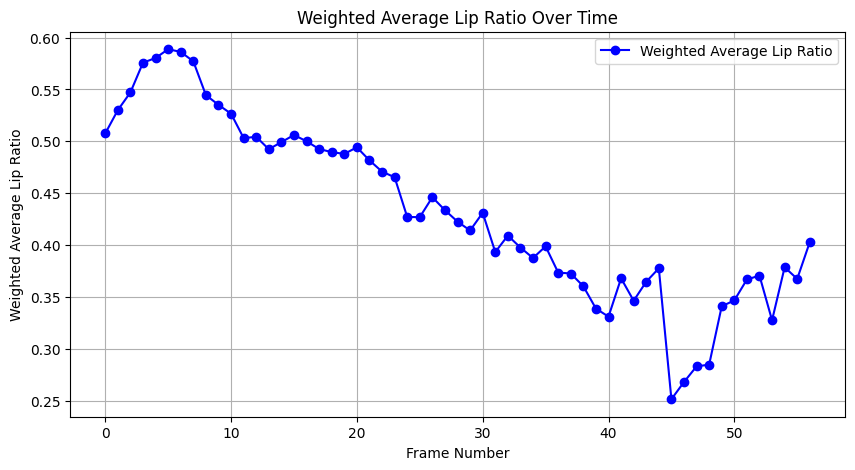

In [ ]:
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt
import math
import os

# Function to calculate Euclidean distance between two points
def euclidean_distance(point1, point2):
    return math.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

# Function to calculate the lip ratio for a given set of lip points
def calculate_lip_ratio(lip_points):
    # Calculate the horizontal distance between points (48, 54)
    horizontal_distance = euclidean_distance(lip_points[48], lip_points[54])

    # Calculate the vertical distances between the pairs (49, 59), (50, 58), (51, 57), (52, 56), (53, 55)
    vertical_distances = [
        euclidean_distance(lip_points[49], lip_points[59]),
        euclidean_distance(lip_points[50], lip_points[58]),
        euclidean_distance(lip_points[51], lip_points[57]),
        euclidean_distance(lip_points[52], lip_points[56]),
        euclidean_distance(lip_points[53], lip_points[55])
    ]

    # Calculate the average vertical distance
    average_vertical_distance = sum(vertical_distances) / len(vertical_distances)

    # Calculate the lip ratio (average vertical distance / horizontal distance)
    lip_ratio = average_vertical_distance / horizontal_distance
    return lip_ratio

# Load dlib's face detector and facial landmarks predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/content/drive/MyDrive/data set/shape_predictor_68_face_landmarks.dat')  # Adjust to your path

# List of video paths
video_paths = [
    '/content/drive/MyDrive/data set/N/N_5.mp4',
    '/content/drive/MyDrive/data set/N/N_5.mp4',
    '/content/drive/MyDrive/data set/N/N_6.mp4',
    '/content/drive/MyDrive/data set/N/N_6_0.5_speed.mp4',
    '/content/drive/MyDrive/data set/N/N_7.mp4',
    '/content/drive/MyDrive/data set/N/N_8.mp4',
    '/content/drive/MyDrive/data set/N/N_9.mp4',
    '/content/drive/MyDrive/data set/N/N_10.mp4',
    '/content/drive/MyDrive/data set/N/N_10.mp4',
    '/content/drive/MyDrive/data set/N/N_10.mp4'
]  # Add paths to your 10 videos

# Dictionary to hold lip ratios for each video
all_lip_ratios = []

# Process each video
for video_path in video_paths:
    cap = cv2.VideoCapture(video_path)
    lip_ratios = []  # List to store lip ratios for the current video

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # Break the loop when video ends

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the frame
        faces = detector(gray)

        # Process the first face detected
        if len(faces) > 0:
            face = faces[0]

            # Get the facial landmarks
            landmarks = predictor(gray, face)

            # Extract the lip points (48 to 67)
            lip_points = {i: (landmarks.part(i).x, landmarks.part(i).y) for i in range(48, 68)}

            # Calculate the lip ratio for this frame
            lip_ratio = calculate_lip_ratio(lip_points)
            lip_ratios.append(lip_ratio)
        else:
            lip_ratios.append(None)  # Append None if no face is detected in this frame

    # Release the video capture object
    cap.release()
    all_lip_ratios.append(lip_ratios)

# Calculate the weighted average lip ratios
max_frames = max(len(ratios) for ratios in all_lip_ratios)
weighted_average_ratios = []

for i in range(max_frames):
    # Gather all lip ratios for the i-th frame from each video
    frame_ratios = [ratios[i] for ratios in all_lip_ratios if i < len(ratios) and ratios[i] is not None]

    if frame_ratios:  # If there are valid ratios for this frame
        weighted_average = sum(frame_ratios) / len(frame_ratios)  # Average
        weighted_average_ratios.append(weighted_average)
    else:
        weighted_average_ratios.append(None)  # If no valid ratios, append None

# Plot the weighted average lip ratios over time (frame number)
plt.figure(figsize=(10, 5))
plt.plot(range(len(weighted_average_ratios)), weighted_average_ratios, marker='o', linestyle='-', color='b', label='Weighted Average Lip Ratio')
plt.title('Weighted Average Lip Ratio Over Time')
plt.xlabel('Frame Number')
plt.ylabel('Weighted Average Lip Ratio')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Save the weighted lip ratios
np.save('points_lip_ratios_N.npy', lip_ratios)


In [ ]:
import numpy as np

# Paths to the saved `.npy` files for 'O' and 'N'
path_to_O_ratios = '/content/points_lip_ratios_O.npy'  # Replace with the actual path
path_to_N_ratios = '/content/points_lip_ratios_N.npy'  # Replace with the actual path

# Load the saved lip ratios
weighted_average_ratios_O = np.load(path_to_O_ratios)
weighted_average_ratios_N = np.load(path_to_N_ratios)

# Now you can proceed with the code for comparing the new video's lip ratios


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Function to compute cosine similarity between two lists
def calculate_cosine_similarity(list1, list2):
    # Handle different lengths by padding the shorter list with None or trimming the longer one
    min_length = min(len(list1), len(list2))
    vec1 = np.array(list1[:min_length])
    vec2 = np.array(list2[:min_length])

    # Remove None values from both vectors
    valid_indices = [i for i in range(min_length) if vec1[i] is not None and vec2[i] is not None]
    vec1 = vec1[valid_indices]
    vec2 = vec2[valid_indices]

    # Reshape vectors to 2D arrays for cosine_similarity function
    vec1 = vec1.reshape(1, -1)
    vec2 = vec2.reshape(1, -1)

    # Calculate cosine similarity
    return cosine_similarity(vec1, vec2)[0][0]

# Assuming you have already calculated weighted_average_ratios for both 'O' and 'N'
# Example: Let's say `weighted_average_ratios_O` and `weighted_average_ratios_N` represent them
# weighted_average_ratios_O = [...]  # Replace with actual calculated ratios for 'O'
# weighted_average_ratios_N = [...]  # Replace with actual calculated ratios for 'N'

# Process the new video to extract lip ratios just like you did for the other videos
new_video_path = '/content/drive/MyDrive/data set/O/O_5 _0.5_speed.mp4'  # Replace with your new video path
new_lip_ratios = []  # Store lip ratios for the new video

# Open the new video and process frames
cap = cv2.VideoCapture(new_video_path)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the frame
    faces = detector(gray)

    if len(faces) > 0:
        face = faces[0]
        landmarks = predictor(gray, face)
        lip_points = {i: (landmarks.part(i).x, landmarks.part(i).y) for i in range(48, 68)}
        lip_ratio = calculate_lip_ratio(lip_points)
        new_lip_ratios.append(lip_ratio)
    else:
        new_lip_ratios.append(None)

cap.release()

# Calculate cosine similarity with 'O' and 'N' weighted averages
similarity_O = calculate_cosine_similarity(new_lip_ratios, weighted_average_ratios_O)
similarity_N = calculate_cosine_similarity(new_lip_ratios, weighted_average_ratios_N)

# Predict the spoken letter
if similarity_O > similarity_N:
    print("Predicted letter: O")
else:
    print("Predicted letter: N")

# Display cosine similarity scores
print(f"Cosine Similarity with 'O': {similarity_O}")
print(f"Cosine Similarity with 'N': {similarity_N}")


Predicted letter: O
Cosine Similarity with 'O': 0.9975284848004004
Cosine Similarity with 'N': 0.9914235157061361


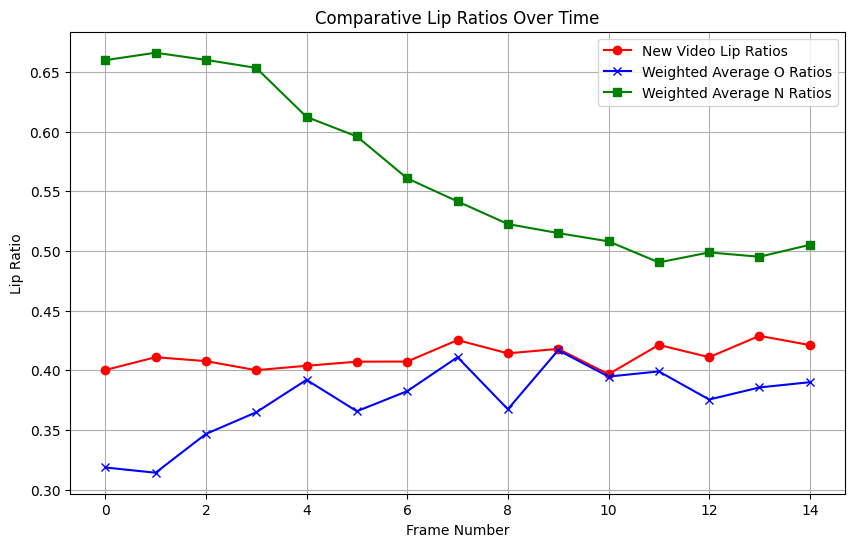

In [ ]:
import matplotlib.pyplot as plt

# Assuming `new_lip_ratios`, `weighted_average_ratios_O`, and `weighted_average_ratios_N` are calculated

# Truncate or pad all lists to match the same length
max_length = min(len(new_lip_ratios), len(weighted_average_ratios_O), len(weighted_average_ratios_N))
new_lip_ratios = new_lip_ratios[:max_length]
weighted_average_ratios_O = weighted_average_ratios_O[:max_length]
weighted_average_ratios_N = weighted_average_ratios_N[:max_length]

# Create a range for the frame numbers
frames = range(max_length)

# Plot the weighted average lip ratios for 'O', 'N', and the new video
plt.figure(figsize=(10, 6))
plt.plot(frames, new_lip_ratios, marker='o', linestyle='-', color='r', label='New Video Lip Ratios')
plt.plot(frames, weighted_average_ratios_O, marker='x', linestyle='-', color='b', label='Weighted Average O Ratios')
plt.plot(frames, weighted_average_ratios_N, marker='s', linestyle='-', color='g', label='Weighted Average N Ratios')

# Add titles and labels
plt.title('Comparative Lip Ratios Over Time')
plt.xlabel('Frame Number')
plt.ylabel('Lip Ratio')
plt.legend()
plt.grid(True)

# Display the plot
plt.show()


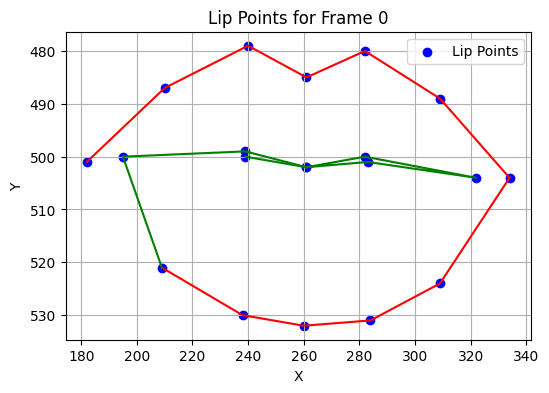

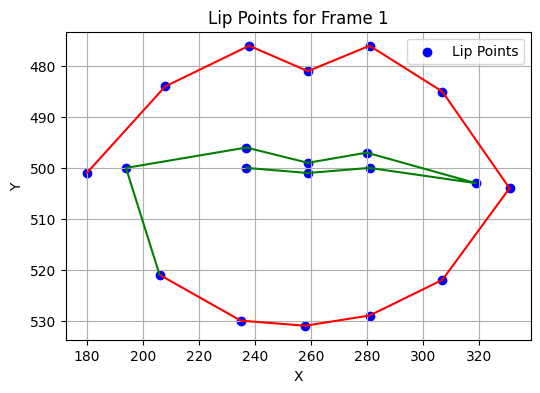

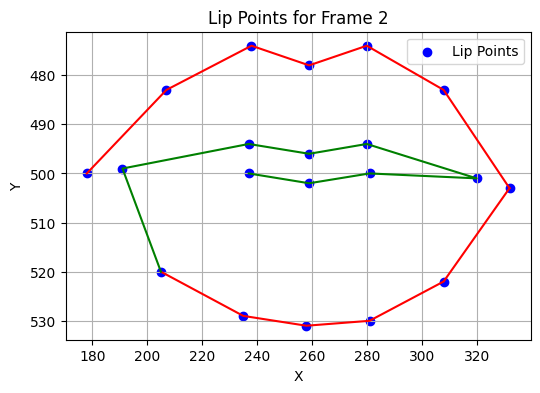

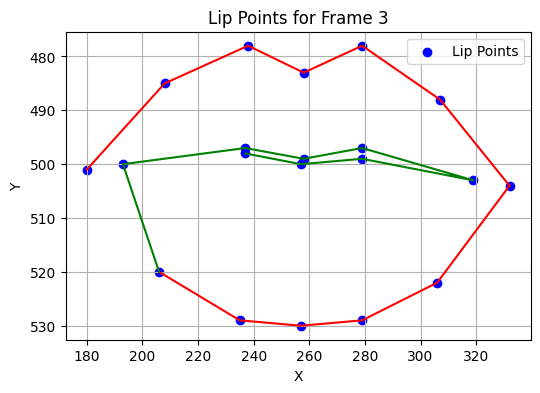

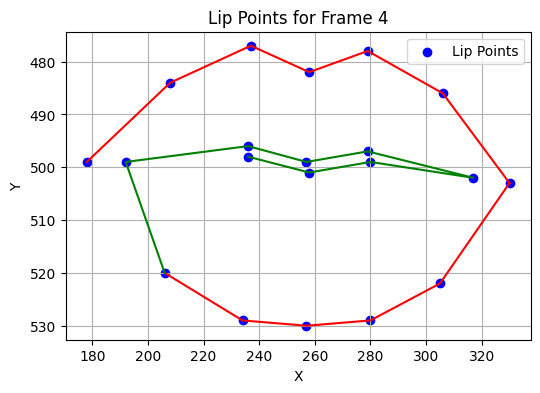

...

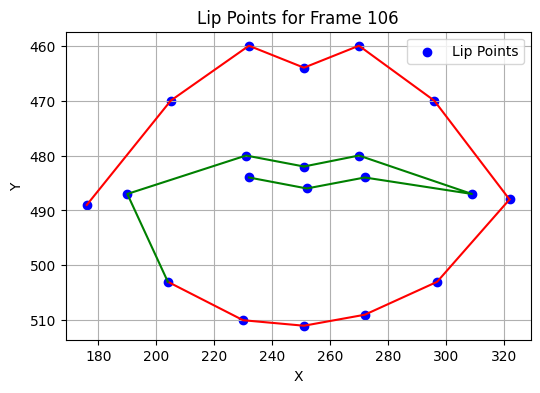

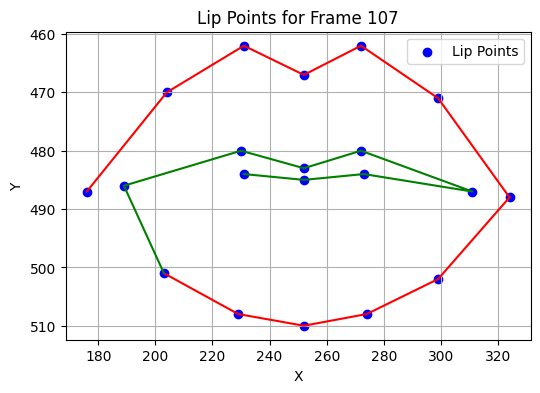

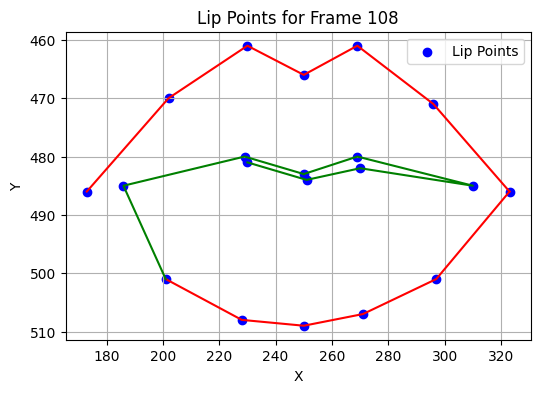

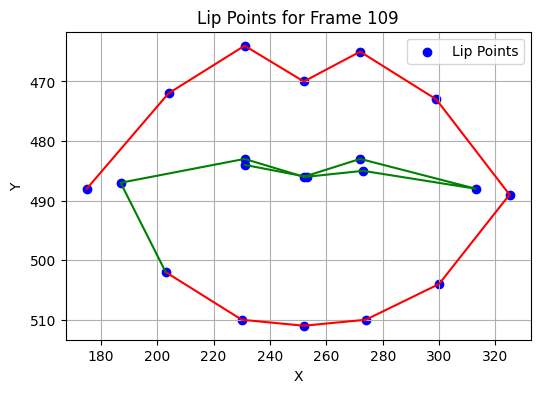

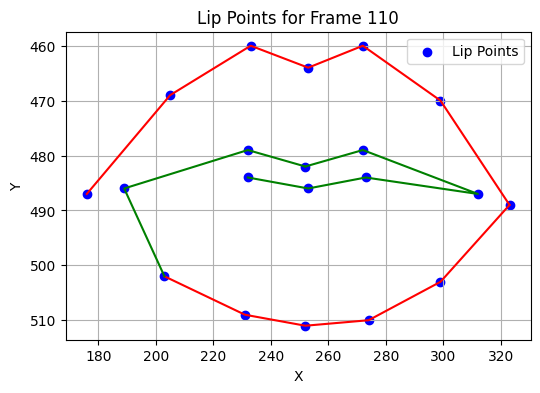

In [ ]:
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

## Function to plot lip points for a single frame
def plot_lip_points(lip_points, frame_number):
    x_coords = [lip_points[i][0] for i in range(48, 68)]
    y_coords = [lip_points[i][1] for i in range(48, 68)]

    plt.figure(figsize=(6, 4))
    plt.scatter(x_coords, y_coords, c='b', label='Lip Points')

     Connect the lip points to visualize the lip shape
    plt.plot(x_coords[:7], y_coords[:7], color='r')  # Outer upper lip (48 to 54)
    plt.plot(x_coords[6:12], y_coords[6:12], color='r')  # Outer lower lip (54 to 60)
    plt.plot(x_coords[11:15], y_coords[11:15], color='g')  # Inner lower lip (60 to 64)
    plt.plot(x_coords[14:], y_coords[14:], color='g')  # Inner upper lip (64 to 68)

    plt.title(f'Lip Points for Frame {frame_number}')
    plt.gca().invert_yaxis()  # Invert y-axis to match image coordinates
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.legend()
    plt.show()

# Load dlib's face detector and shape predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/content/drive/MyDrive/data set/shape_predictor_68_face_landmarks.dat')  # Adjust path if necessary

# Open the video
video_path = '/content/drive/MyDrive/data set/O/O_1.mp4'  # Replace with the path to your 'O.mp4' video
cap = cv2.VideoCapture(video_path)
frame_number = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Exit loop if video ends or error occurs

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the frame
    faces = detector(gray)

    if len(faces) > 0:
        face = faces[0]
        landmarks = predictor(gray, face)

        # Extract the lip points (48 to 67)
        lip_points = {i: (landmarks.part(i).x, landmarks.part(i).y) for i in range(48, 68)}

        # Plot the lip points for this frame
        plot_lip_points(lip_points, frame_number)

    frame_number += 1

cap.release()


Step 1: Function to Extract Lip Points from a Video

In [ ]:
# Function to extract lip points from all frames of a video
def extract_lip_points(video_path):
    cap = cv2.VideoCapture(video_path)
    lip_points_per_frame = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        if len(faces) > 0:
            face = faces[0]
            landmarks = predictor(gray, face)

            # Extract lip points (48 to 67)
            lip_points = {i: (landmarks.part(i).x, landmarks.part(i).y) for i in range(48, 68)}
            lip_points_per_frame.append(lip_points)
        else:
            lip_points_per_frame.append(None)  # No face detected in this frame

    cap.release()
    return lip_points_per_frame


Step 2: Load and Process Videos for "O" and "N"

In [ ]:
# Load lip points from letter "O" and "N" videos
o_video_path = '/content/drive/MyDrive/data set/O/O_1.mp4'  # Path to letter "O" video
n_video_path = '/content/drive/MyDrive/data set/N/N_1.mp4'  # Path to letter "N" video

lip_points_O = extract_lip_points(o_video_path)
lip_points_N = extract_lip_points(n_video_path)


Step 3: Process the New Video for Prediction

In [ ]:
# Load the new video to predict which letter is being spoken
new_video_path = '/content/drive/MyDrive/data set/O/O_6.mp4'  # Path to the new video
lip_points_new_video = extract_lip_points(new_video_path)


Step 4: Compare Frames Using a Similarity Metric (Euclidean Distance)

In [ ]:
# Function to calculate Euclidean distance between two sets of lip points
def calculate_lip_point_distance(lip_points1, lip_points2):
    if lip_points1 is None or lip_points2 is None:
        return float('inf')  # Return infinity if lip points are missing in either frame

    distances = [
        np.linalg.norm(np.array(lip_points1[i]) - np.array(lip_points2[i]))
        for i in range(48, 68)
    ]
    return np.mean(distances)  # Return the average distance between corresponding lip points


Step 5: Predict Which Letter Matches Best

 Adjusting the Loop for Frame Count Differences

In [ ]:
# Compare up to the number of available frames in both videos
min_frames = min(len(lip_points_O), len(lip_points_N), len(lip_points_new_video))

matches_O = []
matches_N = []

for i in range(min_frames):  # Limit comparison to the shortest video
    lip_points_frame = lip_points_new_video[i]

    if lip_points_frame is not None:
        # Compare with the corresponding frame from "O"
        distance_O = calculate_lip_point_distance(lip_points_frame, lip_points_O[i])

        # Compare with the corresponding frame from "N"
        distance_N = calculate_lip_point_distance(lip_points_frame, lip_points_N[i])

        matches_O.append(distance_O)
        matches_N.append(distance_N)

# Calculate the average distance for "O" and "N"
average_distance_O = np.mean(matches_O)
average_distance_N = np.mean(matches_N)

# Make prediction based on the smaller average distance
if average_distance_O < average_distance_N:
    print("Predicted letter: O")
else:
    print("Predicted letter: N")

# Display the average distances
print(f"Average distance to 'O': {average_distance_O}")
print(f"Average distance to 'N': {average_distance_N}")


Predicted letter: O
Average distance to 'O': 341.97560907583943
Average distance to 'N': 343.1494720142439


Handle Missing Faces or Frames

In [ ]:
# Modified to handle missing frames gracefully
for i in range(min_frames):
    lip_points_frame = lip_points_new_video[i]

    if lip_points_frame is not None and lip_points_O[i] is not None and lip_points_N[i] is not None:
        # Only compute distances if valid lip points exist for all videos
        distance_O = calculate_lip_point_distance(lip_points_frame, lip_points_O[i])
        distance_N = calculate_lip_point_distance(lip_points_frame, lip_points_N[i])

        matches_O.append(distance_O)
        matches_N.append(distance_N)
    else:
        # If any lip points are missing, skip the comparison for this frame
        continue


Load and process all 7 videos of "O" and "N."
For each frame in the new video, compare the lip points with all frames from the 7 videos of both letters.
Calculate the average distance from the new video’s frames to the corresponding frames of all "O" videos and all "N" videos.
Make a prediction based on the smaller average distance.

In [ ]:
import cv2
import dlib
import numpy as np

# Function to calculate Euclidean distance between two points
def euclidean_distance(point1, point2):
    return np.linalg.norm(np.array(point1) - np.array(point2))

# Function to calculate distance between two sets of lip points
def calculate_lip_point_distance(lip_points1, lip_points2):
    return np.mean([euclidean_distance(lip_points1[i], lip_points2[i]) for i in range(48, 68)])

# Function to extract lip points from a video
def extract_lip_points_from_video(video_path, detector, predictor):
    cap = cv2.VideoCapture(video_path)
    lip_points_all_frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        if len(faces) > 0:
            face = faces[0]
            landmarks = predictor(gray, face)
            lip_points = {i: (landmarks.part(i).x, landmarks.part(i).y) for i in range(48, 68)}
            lip_points_all_frames.append(lip_points)
        else:
            lip_points_all_frames.append(None)

    cap.release()
    return lip_points_all_frames

# Function to calculate average distance to multiple reference videos
def calculate_average_distance_to_reference_videos(new_video_lip_points, reference_videos_lip_points):
    min_frames = min([len(new_video_lip_points)] + [len(ref_video) for ref_video in reference_videos_lip_points])
    total_distances = []

    for i in range(min_frames):
        lip_points_frame = new_video_lip_points[i]

        if lip_points_frame is not None:
            distances_for_frame = []

            # Compare with each reference video
            for ref_video_lip_points in reference_videos_lip_points:
                if ref_video_lip_points[i] is not None:
                    distance = calculate_lip_point_distance(lip_points_frame, ref_video_lip_points[i])
                    distances_for_frame.append(distance)

            if distances_for_frame:
                avg_distance_for_frame = np.mean(distances_for_frame)  # Average across all reference videos for this frame
                total_distances.append(avg_distance_for_frame)

    return np.mean(total_distances) if total_distances else float('inf')

# Load dlib's face detector and shape predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/content/drive/MyDrive/data set/shape_predictor_68_face_landmarks.dat')  # Adjust path

# List of video paths for 7 videos of O and 7 videos of N
O_video_paths = [
    '/content/drive/MyDrive/data set/O/O_1.mp4',
    '/content/drive/MyDrive/data set/O/O_2.mp4',
    '/content/drive/MyDrive/data set/O/O_5.mp4',
    '/content/drive/MyDrive/data set/O/O_6.mp4',
    '/content/drive/MyDrive/data set/O/O_7.mp4',
    '/content/drive/MyDrive/data set/O/O_8.mp4',
    '/content/drive/MyDrive/data set/O/O_9.mp4'
]

N_video_paths = [
    '/content/drive/MyDrive/data set/N/N_1.mp4',
    '/content/drive/MyDrive/data set/N/N_2.mp4',
    '/content/drive/MyDrive/data set/N/N_5.mp4',
    '/content/drive/MyDrive/data set/N/N_6.mp4',
    '/content/drive/MyDrive/data set/N/N_7.mp4',
    '/content/drive/MyDrive/data set/N/N_8.mp4',
    '/content/drive/MyDrive/data set/N/N_9.mp4'
]

# Extract lip points for all O and N videos
lip_points_O_videos = [extract_lip_points_from_video(path, detector, predictor) for path in O_video_paths]
lip_points_N_videos = [extract_lip_points_from_video(path, detector, predictor) for path in N_video_paths]

# Process the new video (video to predict)
new_video_path = '/content/drive/MyDrive/data set/O/O_5 _0.5_speed.mp4'  # Replace with the new video path
lip_points_new_video = extract_lip_points_from_video(new_video_path, detector, predictor)

# Calculate average distances to O and N videos
average_distance_to_O = calculate_average_distance_to_reference_videos(lip_points_new_video, lip_points_O_videos)
average_distance_to_N = calculate_average_distance_to_reference_videos(lip_points_new_video, lip_points_N_videos)

# Make prediction based on the smaller average distance
if average_distance_to_O < average_distance_to_N:
    print("Predicted letter: O")
else:
    print("Predicted letter: N")

# Display the average distances
print(f"Average distance to 'O': {average_distance_to_O}")
print(f"Average distance to 'N': {average_distance_to_N}")


Predicted letter: O
Average distance to 'O': 233.99987700164928
Average distance to 'N': 273.74916904805235


Aggregate Frame Similarities:

Calculate and save the average Euclidean distances across all frames within each video to get a representative "signature" of the lip motion for each letter.
Use this signature as a baseline to compare against new videos.
Introduce Classification:

Compile the distances or other feature vectors from multiple videos of each letter.
Train a simple classifier (e.g., k-Nearest Neighbors, SVM) to predict the letter based on these distance metrics or other features.
Real-time Testing:

Try testing the model on new videos. Feed the frames into your pipeline, calculate the Euclidean distance for each, and compare them to the saved averages to predict the letter.
Optimize with Additional Features:

Incorporate additional features like frame intensity patterns or temporal data (e.g., sequence patterns in motion) to improve accuracy.
Evaluate Performance:

Test the accuracy of predictions on a set of validation videos, and track metrics like accuracy, precision, and recall to fine-tune thresholds.

To calculate and save the average Euclidean distances across frames within each video as a signature, here’s a code example. This will create a baseline by averaging the distances between consecutive frames in each video.

In [ ]:
import cv2
import dlib
import numpy as np
from scipy.spatial.distance import euclidean
import os

# Initialize dlib's face detector and shape predictor (68 landmark model)
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor("/content/drive/MyDrive/data set/shape_predictor_68_face_landmarks.dat")

# Function to detect landmarks for all frames in a video
def detect_landmarks_for_video(video_path):
    cap = cv2.VideoCapture(video_path)
    all_landmarks = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        if faces:
            # Get the landmarks for the first detected face
            landmarks = predictor(gray, faces[0])
            # Extract coordinates and append as a list of tuples
            frame_landmarks = [(landmarks.part(i).x, landmarks.part(i).y) for i in range(68)]
            all_landmarks.append(frame_landmarks)

    cap.release()
    return all_landmarks

# Function to extract lip region features (as before)
def extract_lip_region(frame, landmarks):
    lip_points = landmarks[48:68]  # Assuming landmarks 48-67 are the lips
    x, y, w, h = cv2.boundingRect(np.array(lip_points))
    lip_region = frame[y:y+h, x:x+w]
    lip_region = cv2.resize(lip_region, (50, 50))  # Resize for consistency
    return lip_region.flatten()  # Flatten to a vector for Euclidean distance calculation

# Function to compute average Euclidean distance across all frames in a video
def compute_average_distance(video_path, landmarks_list):
    cap = cv2.VideoCapture(video_path)
    distances = []

    ret, prev_frame = cap.read()
    if not ret:
        return None

    prev_lip_features = extract_lip_region(prev_frame, landmarks_list[0])

    for i in range(1, len(landmarks_list)):
        ret, current_frame = cap.read()
        if not ret:
            break

        current_lip_features = extract_lip_region(current_frame, landmarks_list[i])
        distance = euclidean(prev_lip_features, current_lip_features)
        distances.append(distance)

        prev_lip_features = current_lip_features

    cap.release()
    if distances:
        return np.mean(distances)
    return None

# Function to process multiple videos and save their signatures
def create_signature_database(video_folder):
    signatures = {}
    for filename in os.listdir(video_folder):
        if filename.endswith('.mp4'):
            video_path = os.path.join(video_folder, filename)
            landmarks_list = detect_landmarks_for_video(video_path)
            if landmarks_list:
                signature = compute_average_distance(video_path, landmarks_list)
                if signature is not None:
                    signatures[filename] = signature
    return signatures

# Example usage
video_folder = "/content/drive/MyDrive/data set/A"
signatures = create_signature_database(video_folder)

# Save the signatures for future comparisons
import json
with open("/content/drive/MyDrive/data set/A/lip_signatures_A.json", "w") as f:
    json.dump(signatures, f)


To compare a new video against your saved signatures and predict the closest match, you can:

Extract the Signature of the New Video: Process the new video to calculate its average Euclidean distance (following the same method as the saved signatures).
Compare to Existing Signatures: Use a similarity measure (e.g., absolute difference) between the new video's signature and each saved signature.
Select the Closest Match: Find the letter signature with the smallest distance to identify the likely spoken letter.

In [ ]:
import json
import cv2
import numpy as np
from scipy.spatial.distance import euclidean
import dlib

# Load previously saved signatures
with open("/content/drive/MyDrive/data set/A/lip_signatures_A.json", "r") as f:
    saved_signatures = json.load(f)

# Reinitialize the face detector and landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor("/content/drive/MyDrive/data set/shape_predictor_68_face_landmarks.dat")

# Function to detect landmarks for each frame in a video
def detect_landmarks_for_video(video_path):
    cap = cv2.VideoCapture(video_path)
    all_landmarks = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        if faces:
            landmarks = predictor(gray, faces[0])
            frame_landmarks = [(landmarks.part(i).x, landmarks.part(i).y) for i in range(68)]
            all_landmarks.append(frame_landmarks)

    cap.release()
    return all_landmarks

# Function to extract lip region and compute average distance
def compute_average_distance(video_path, landmarks_list):
    cap = cv2.VideoCapture(video_path)
    distances = []

    ret, prev_frame = cap.read()
    if not ret:
        return None

    prev_lip_features = extract_lip_region(prev_frame, landmarks_list[0])

    for i in range(1, len(landmarks_list)):
        ret, current_frame = cap.read()
        if not ret:
            break

        current_lip_features = extract_lip_region(current_frame, landmarks_list[i])
        distance = euclidean(prev_lip_features, current_lip_features)
        distances.append(distance)

        prev_lip_features = current_lip_features

    cap.release()
    if distances:
        return np.mean(distances)
    return None

# Function to find the closest signature match
def find_closest_match(new_video_path):
    # Detect landmarks and compute the signature for the new video
    new_landmarks = detect_landmarks_for_video(new_video_path)
    if not new_landmarks:
        print("No landmarks detected in the new video.")
        return None

    new_signature = compute_average_distance(new_video_path, new_landmarks)

    # Calculate distance between the new signature and each saved signature
    closest_match = None
    smallest_distance = float('inf')

    for letter, saved_signature in saved_signatures.items():
        distance = abs(new_signature - saved_signature)
        print(f"Distance to {letter}: {distance}")

        if distance < smallest_distance:
            smallest_distance = distance
            closest_match = letter

    return closest_match

# Example usage
new_video_path = "/content/drive/MyDrive/data set/test/a_colon.mp4"  # Replace with the path to the new video
predicted_letter = find_closest_match(new_video_path)
print(f"The predicted letter is: {predicted_letter}")


Distance to ae.mp4: 19.937624972129925
Distance to aee.mp4: 23.156413301572684
Distance to ac.mp4: 8.243018027225844
Distance to ei.mp4: 182.75491455285737
Distance to i.mp4: 330.9603056821197
Distance to shwa.mp4: 335.2197957777407
The predicted letter is: ac.mp4


To predict the word "NO" using the signatures of letters 'N' and 'O,' you could break down the video of "NO" into segments for each letter and match each segment to the stored signatures. Here's an outline of how to implement this:

Divide Frames for Each Letter:

Start by manually or automatically segmenting the video of "NO" into two parts—frames likely corresponding to the 'N' and 'O' phonemes. You could experiment with splitting the frames equally or apply a basic temporal heuristic if you have an idea of where each sound starts.
Compute Signatures for Each Segment:

Use the existing compute_average_distance function on each segment (for 'N' and then 'O') to calculate an average distance signature, just as you would for individual letter videos.
Match Each Segment to Known Signatures:

For the segment that you assume to be 'N,' calculate the distance between its signature and your saved 'N' signature.
Repeat this for the 'O' segment.
If each segment matches the intended letter’s signature closely (using a pre-defined threshold for similarity), then the word "NO" can be confirmed.
Here’s a basic implementation:

In [ ]:
import cv2

# Function to segment video into two parts for "NO"
def segment_video_for_word(video_path):
    cap = cv2.VideoCapture(video_path)

    # Check if the video opened successfully
    if not cap.isOpened():
        print("Error: Could not open video.")
        return [], []

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in video: {total_frames}")

    # Assuming an approximate halfway split for 'N' and 'O' segments
    halfway_frame = total_frames // 2
    segment_N, segment_O = [], []

    for i in range(total_frames):
        ret, frame = cap.read()  # Extract a frame from the video
        if not ret:
            print("Error: Could not read frame.")
            break  # Exit the loop if no frame is read

        if i < halfway_frame:
            segment_N.append(frame)  # Store frames for "N"
        else:
            segment_O.append(frame)  # Store frames for "O"

    cap.release()  # Release the video capture object
    print(f"Frames in segment N: {len(segment_N)}")
    print(f"Frames in segment O: {len(segment_O)}")

    return segment_N, segment_O

# Example usage
video_path_NO = "/content/drive/MyDrive/data set/words/NO_1.mp4"
segment_N_frames, segment_O_frames = segment_video_for_word(video_path_NO)

# Verify the number of frames segmented
print(f"Segment N contains {len(segment_N_frames)} frames.")
print(f"Segment O contains {len(segment_O_frames)} frames.")


Total frames in video: 22
Error: Could not read frame.
Frames in segment N: 11
Frames in segment O: 10
Segment N contains 11 frames.
Segment O contains 10 frames.


Your code for segmenting the video into two parts based on frame count looks good. It splits the video frames approximately in half, assuming the first half corresponds to "N" and the second half to "O."

If you want to match the frames in each segment to the respective letters 'N' and 'O' using the saved signatures, you could add functionality to extract lip features from each frame in segment_N_frames and segment_O_frames and then compare them to the signatures.

Here’s how you could extend the code to perform frame-to-signature matching for each segment:

In [ ]:
import json

# Load signature from JSON file and handle possible dictionary structure
def load_signature(signature_path):
    with open(signature_path, 'r') as file:
        data = json.load(file)
    # If data is a dictionary, extract values; otherwise, assume it's already a list
    return list(data.values()) if isinstance(data, dict) else data

# Paths to the signature files
signature_N_path = "/content/drive/MyDrive/data set/N/lip_signatures_N.json"
signature_O_path = "/content/drive/MyDrive/data set/O/lip_signatures_O.json"  # Replace with actual path

# Load the signatures
signature_N = load_signature(signature_N_path)
signature_O = load_signature(signature_O_path)

print("Signature N:", signature_N)
print("Signature O:", signature_O)


Signature N: [14272.29909004482, 14113.670910187466, 14319.8241354128, 14319.754748922245, 13955.47478376394, 14586.690745114774, 13814.316276831029, 14069.625487124462, 13997.644770673556, 14349.83679803531, 14562.052605496994]
Signature O: [14702.341881316246, 14580.996406586433, 14530.660391044114, 14552.904348849037, 14294.08893741626, 14179.27177254308, 14353.070756323841, 14304.445213492258, 14162.964482133224, 13087.016282078648, 13854.800622172306, 14232.005244329066, 14838.358974879307, 13999.587795129937, 14708.826111231843, 14354.424249829704]


In [ ]:
import cv2
import numpy as np
import json
from collections import Counter

# Load signature from JSON file
def load_signature(signature_path):
    with open(signature_path, 'r') as file:
        data = json.load(file)
    return list(data.values()) if isinstance(data, dict) else data

# Paths to the signature files
signature_N_path = "/content/drive/MyDrive/data set/N/lip_signatures_N.json"
signature_O_path = "/content/drive/MyDrive/data set/O/lip_signatures_O.json"  # Replace with actual path

# Load the signatures
signature_N = load_signature(signature_N_path)
signature_O = load_signature(signature_O_path)

# Determine the maximum signature length
max_signature_length = max(len(signature_N), len(signature_O))
print(f"Max Signature Length: {max_signature_length}")

# Function to extract lip features from a frame
def extract_lip_features(frame):
    # Placeholder for actual lip feature extraction logic
    # This should return a feature vector of length matching the signatures
    features = np.random.rand(max_signature_length)  # Generating random features for demonstration
    return features

# Compute similarity between frame features and a signature
def compute_similarity(features, signature):
    # Adjust feature and signature lengths to be the same
    if len(features) > len(signature):
        features = features[:len(signature)]  # Truncate
    elif len(features) < len(signature):
        features = np.pad(features, (0, len(signature) - len(features)), 'constant')  # Pad

    print(f"Features shape: {features.shape}, Signature shape (N): {len(signature_N)}, Signature shape (O): {len(signature_O)}")
    return np.linalg.norm(np.array(features) - np.array(signature))

# Match frames in the video to the letters 'N' and 'O'
def match_frames_to_signatures(video_path, signature_N, signature_O):
    cap = cv2.VideoCapture(video_path)
    matched_letters = []

    if not cap.isOpened():
        print("Error: Could not open video.")
        return matched_letters

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in video: {total_frames}")

    for _ in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            print("Error: Could not read frame.")
            break

        # Extract features for the current frame
        features = extract_lip_features(frame)

        # Compute similarity to both signatures
        similarity_to_N = compute_similarity(features, signature_N)
        similarity_to_O = compute_similarity(features, signature_O)

        # Match the letter based on similarity
        matched_letter = 'N' if similarity_to_N < similarity_to_O else 'O'
        matched_letters.append(matched_letter)

    cap.release()
    return matched_letters

# Get the dominant letter for the sequence of matched letters
def predict_spoken_word(matched_letters):
    letter_counts = Counter(matched_letters)
    print(f"Letter counts: {letter_counts}")
    return letter_counts.most_common(1)[0][0]  # Returns the most common letter

# Example usage
video_path_NO = "/content/drive/MyDrive/data set/words/NO_1_0.5_speed.mp4"
matched_letters = match_frames_to_signatures(video_path_NO, signature_N, signature_O)

if matched_letters:
    print(f"Matched letters sequence: {matched_letters}")
    predicted_word = predict_spoken_word(matched_letters)
    print(f"Predicted spoken word: {predicted_word}")
else:
    print("No letters matched. Check the video processing.")


Max Signature Length: 16
Total frames in video: 21
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (16,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (16,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (16,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (16,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (16,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (16,), Signature shape (N): 11, Signature shape (O): 16
Features shape: (11,), Signature shape (N): 11, Signature shape (O): 16
Features shap

To further analyze the matching process, you can modify the code to print out the similarity scores for each frame along with the matched letters:

In [ ]:
def match_frames_to_signatures(video_path, signature_N, signature_O):
    cap = cv2.VideoCapture(video_path)
    matched_letters = []

    if not cap.isOpened():
        print("Error: Could not open video.")
        return matched_letters

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in video: {total_frames}")

    for _ in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            print("Error: Could not read frame.")
            break

        # Extract features for the current frame
        features = extract_lip_features(frame)

        # Compute similarity to both signatures
        similarity_to_N = compute_similarity(features, signature_N)
        similarity_to_O = compute_similarity(features, signature_O)

        # Match the letter based on similarity
        matched_letter = 'N' if similarity_to_N < similarity_to_O else 'O'
        matched_letters.append(matched_letter)

        # Log the similarity scores
        print(f"Frame {_}: Similarity to N: {similarity_to_N:.2f}, Similarity to O: {similarity_to_O:.2f}, Matched Letter: {matched_letter}")

    cap.release()
    return matched_letters
